In [2]:
setwd(..)
import sys
# the mock-0.3.1 dir contains testcase.py, testutils.py & mock.py
sys.path.append('')

import pandas as pd
import numpy as np
import make_network as mn
import networkx as nx
import community

from patsy import dmatrices

import matplotlib.pyplot as plt

import matplotlib
import seaborn.apionly as sbn 

import network_analysis as nal

import scipy.stats as st

%matplotlib inline

SyntaxError: invalid syntax (3737249070.py, line 1)

NameError: name 'transnet' is not defined

In [10]:
import os
os.chdir("../..")

In [11]:
os.getcwd()

'/Users/LAPT0084/Documents/nCOV'

In [2]:
vo_frame = pd.read_csv('vo_jan2013.csv')

In [3]:
bo_frame = pd.read_csv('bo_jan2013.csv')

In [4]:
so_frame = pd.read_csv('so_jan2013.csv')

In [5]:
bo_frame.columns

Index([u'objectid', u'bevoegd_gezag_nummer', u'brin_nummer',
       u'vestigingsnummer', u'vestigingsnaam', u'denominatie', u'straatnaam',
       u'huisnummer_toevoeging', u'pc6', u'plaatsnaam', u'gem_code',
       u'gemeentenaam', u'provincie', u'ggd', u'internetadres', u'xcoord',
       u'ycoord', u'geocod', u'opmerking_geocode', u'leerlingen',
       u'lftd_3_jaar', u'lftd_4_jaar', u'lftd_5_jaar', u'lftd_6_jaar',
       u'lftd_7_jaar', u'lftd_8_jaar', u'lftd_9_jaar', u'lftd_10_jaar',
       u'lftd_11_jaar', u'lftd_12_jaar', u'lftd_13_jaar', u'lftd_14_jaar'],
      dtype='object')

In [6]:
all_frame = pd.concat([vo_frame, bo_frame, so_frame])

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [7]:
all_frame.columns

Index([u'bevoegd_gezag_nummer', u'brin_nummer', u'brinnummer', u'cluster',
       u'denominatie', u'gem_code', u'gemeentenaam', u'geocod', u'ggd',
       u'huisnummer_toevoeging', u'internetadres', u'jaar_1', u'jaar_2',
       u'jaar_3', u'jaar_4', u'jaar_5', u'jaar_6', u'leerlingen',
       u'lftd_10_jaar', u'lftd_10tm12', u'lftd_11_jaar', u'lftd_12_jaar',
       u'lftd_13_jaar', u'lftd_13tm15', u'lftd_14_jaar', u'lftd_16tm20',
       u'lftd_1tm6', u'lftd_21tm27', u'lftd_3_jaar', u'lftd_4_jaar',
       u'lftd_5_jaar', u'lftd_6_jaar', u'lftd_7_jaar', u'lftd_7tm9',
       u'lftd_8_jaar', u'lftd_9_jaar', u'objectid', u'onderwijsstructuur',
       u'opmerking_geocode', u'pc6', u'plaatsnaam', u'provincie',
       u'soort_primair_onderwijs', u'straatnaam', u'vest_perbrin',
       u'vestigingsnaam', u'vestigingsnummer', u'xcoord', u'ycoord'],
      dtype='object')

In [8]:
prop_students_by_den = all_frame.groupby('denominatie').sum().leerlingen/all_frame.leerlingen.sum()

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/pandas/core/computation/check.py:17: UserWarning: The installed version of numexpr 2.4.4 is not supported in pandas and will be not be used
The minimum supported version is 2.4.6

  ver=ver, min_ver=_MIN_NUMEXPR_VERSION), UserWarning)


In [9]:
prop_schools_by_den = all_frame.groupby('denominatie').count().objectid/len(all_frame)

In [10]:
prop_students_by_den.sort_values(ascending=False)

denominatie
Rooms-Katholiek                   0.303273
Openbaar                          0.284014
Protestants-Christelijk           0.212780
Algemeen bijzonder                0.093194
Samenwerking PC, RK               0.040317
Reformatorisch                    0.023997
Antroposofisch                    0.007853
Samenwerking PC, RK, Alg. Bijz    0.007172
Gereformeerd vrijgemaakt          0.006787
Islamitisch                       0.004073
Gereformeerd                      0.003810
Interconfessioneel                0.003250
Samenwerking RK, Alg. Bijz.       0.003135
Samenwerking Opb., RK             0.001333
Evangelisch                       0.001205
Protestants Christelijk/Reform    0.000796
Samenwerking Opb., Alg. Bijz.     0.000747
Hindoe�stisch                     0.000665
Protestants-Christelijk/Evange    0.000391
Overige                           0.000285
Samenwerking Opb., PC, RK, Alg    0.000283
Evangelische broedergemeenscha    0.000178
Joods                             0.000145

In [11]:
prop_schools_by_den.sort_values(ascending=False)*100

denominatie
Openbaar                          30.930105
Rooms-Katholiek                   28.112273
Protestants-Christelijk           23.632361
Algemeen bijzonder                 8.882774
Reformatorisch                     2.289488
Samenwerking PC, RK                2.014309
Gereformeerd vrijgemaakt           1.298844
Antroposofisch                     0.891580
Islamitisch                        0.484315
Samenwerking PC, RK, Alg. Bijz     0.440286
Interconfessioneel                 0.231150
Gereformeerd                       0.198129
Evangelisch                        0.176114
Hindoe�stisch                      0.066043
Samenwerking RK, Alg. Bijz.        0.066043
Overige                            0.044029
Samenwerking Opb., RK              0.044029
Samenwerking Opb., Alg. Bijz.      0.033021
Samenwerking Opb., PC              0.033021
Joods                              0.022014
Samenwerking Opb., PC, RK, Alg     0.022014
Evangelische broedergemeenscha     0.022014
Samenwerking PC, Alg

In [12]:
percent_rep_tab = 100*pd.DataFrame([prop_schools_by_den,prop_students_by_den]).transpose().rename(columns={'objectid':'schools', 'leerlingen':'Pupils'}).sort_values('schools', ascending=False)

In [13]:
percent_rep_tab = percent_rep_tab.reset_index()
percent_rep_tab['mix'] = ['Samen' not in n for n in percent_rep_tab.denominatie]

Text(0.5,0,'%')

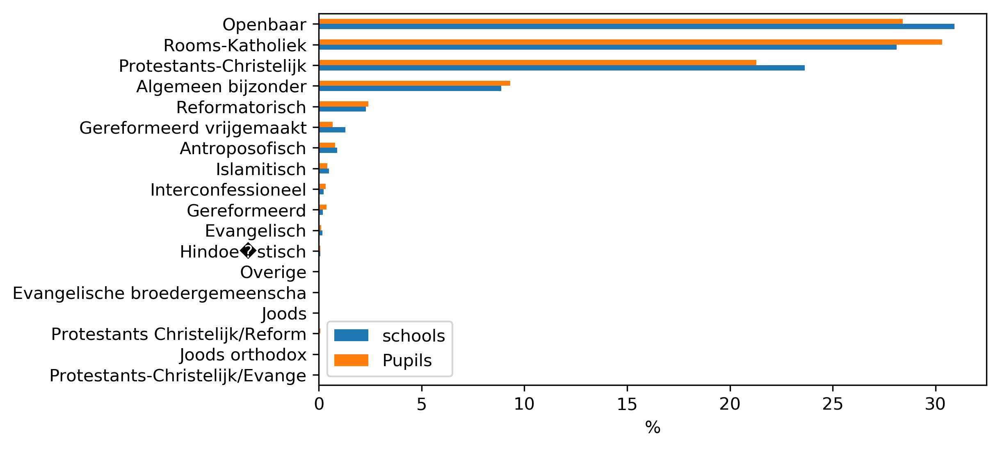

In [14]:
fig =plt.figure(figsize=[7,4], dpi=300)
ax=fig.add_subplot(111)
percent_rep_tab.sort_values(['mix', 'schools'], ascending=True).fillna(0).query('mix != 0').drop('mix', axis=1).set_index('denominatie').plot(kind='barh', ax=ax)
ax.set_ylabel('')
ax.set_xlabel('%')


In [15]:
prop_schools_by_den

denominatie
Algemeen bijzonder                0.088828
Antroposofisch                    0.008916
Evangelisch                       0.001761
Evangelische broedergemeenscha    0.000220
Gereformeerd                      0.001981
Gereformeerd vrijgemaakt          0.012988
Hindoe�stisch                     0.000660
Interconfessioneel                0.002312
Islamitisch                       0.004843
Joods                             0.000220
Joods orthodox                    0.000110
Openbaar                          0.309301
Overige                           0.000440
Protestants Christelijk/Reform    0.000110
Protestants-Christelijk           0.236324
Protestants-Christelijk/Evange    0.000110
Reformatorisch                    0.022895
Rooms-Katholiek                   0.281123
Samenwerking Opb., Alg. Bijz.     0.000330
Samenwerking Opb., PC             0.000330
Samenwerking Opb., PC, RK         0.000110
Samenwerking Opb., PC, RK, Alg    0.000220
Samenwerking Opb., RK             0.000440

In [16]:
import transnet

In [18]:
degree_df = pd.DataFrame.from_dict(transnet.data_net.degree(), orient='index', columns=['degree']).reset_index().rename(columns={'index':'BRIN'})
weighted_degree_df = pd.DataFrame.from_dict(transnet.data_net.degree(weight='weight'), orient='index', columns=['weighted_degree']).reset_index().rename(columns={'index':'BRIN'})

In [19]:
all_frame = all_frame.rename(columns={u'vestigingsnummer':'BRIN'})

In [20]:
all_frame = all_frame.merge(weighted_degree_df, on='BRIN')
all_frame = all_frame.merge(degree_df, on='BRIN')

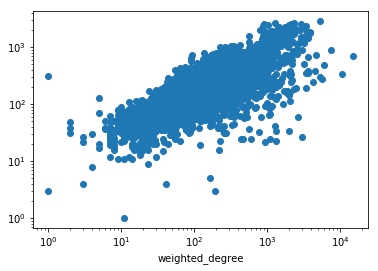

In [21]:
all_frame.plot('weighted_degree', 'leerlingen', style='o', legend=False)
plt.xscale('log')
plt.yscale('log')

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/scipy/stats/stats.py:1626: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


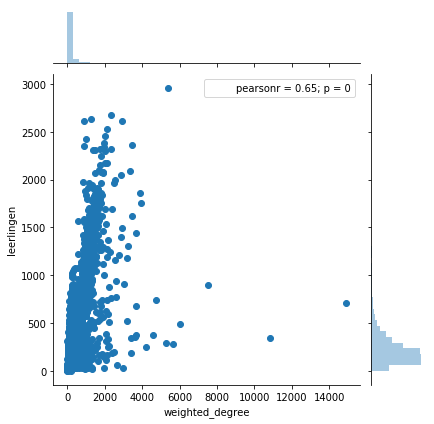

In [21]:
sbn.jointplot(data=all_frame, x='weighted_degree', y='leerlingen')


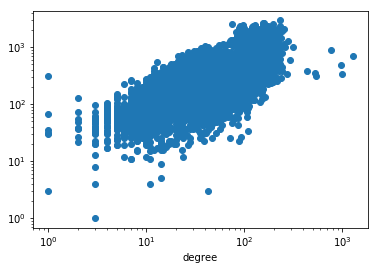

In [22]:
all_frame.plot('degree', 'leerlingen', style='o', legend=False)
plt.xscale('log')
plt.yscale('log')

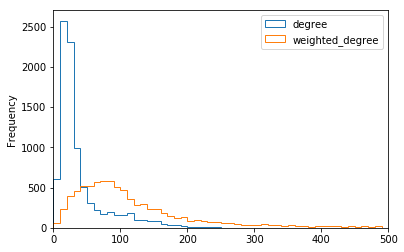

In [23]:
all_frame.plot(y=['degree', 'weighted_degree'], kind='hist',bins=range(0,500,10), xlim=[0,500], histtype='step', alpha=1.)

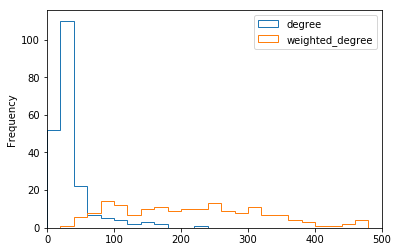

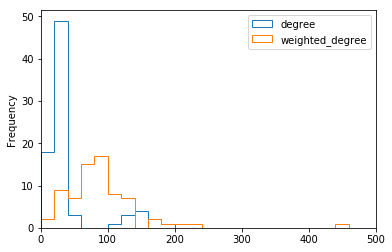

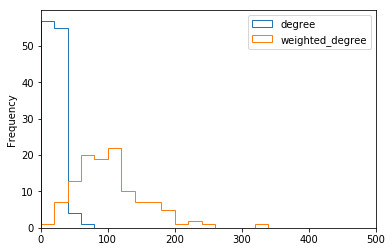

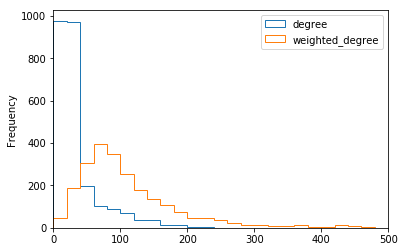

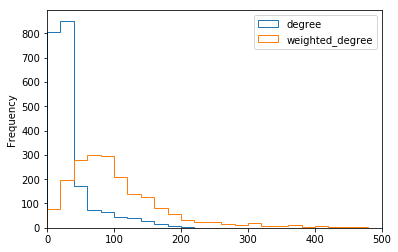

In [24]:
all_frame.query('denominatie == "Reformatorisch"').plot(y=['degree', 'weighted_degree'], kind='hist',bins=range(0,500,20), xlim=[0,500], histtype='step')
all_frame.query('denominatie == "Antroposofisch"').plot(y=['degree', 'weighted_degree'], kind='hist',bins=range(0,500,20), xlim=[0,500], histtype='step')
all_frame.query('denominatie == "Gereformeerd vrijgemaakt"').plot(y=['degree', 'weighted_degree'], kind='hist',bins=range(0,500,20), xlim=[0,500], histtype='step')
all_frame.query('denominatie == "Rooms-Katholiek"').plot(y=['degree', 'weighted_degree'], kind='hist',bins=range(0,500,20), xlim=[0,500], histtype='step')
all_frame.query('denominatie == "Protestants-Christelijk"').plot(y=['degree', 'weighted_degree'], kind='hist',bins=range(0,500,20), xlim=[0,500], histtype='step')

In [22]:
sec_codes = vo_frame.vestigingsnummer

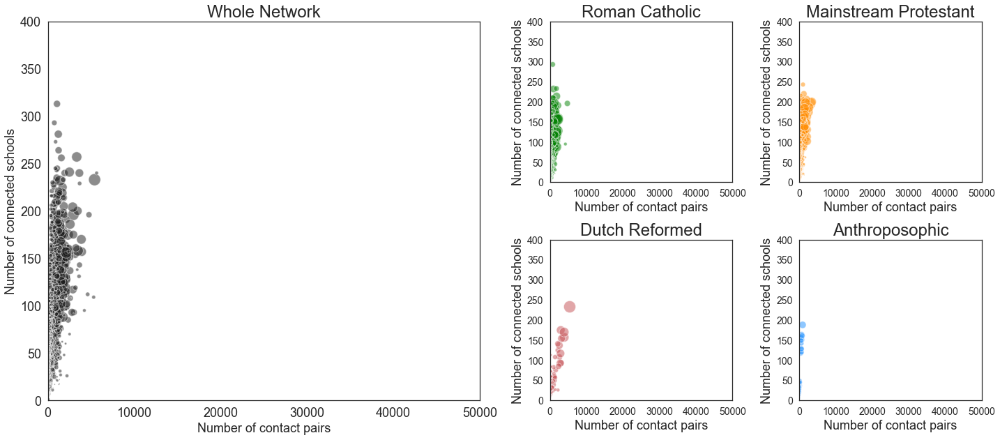

In [25]:
max_w = 50000.
max_d = 400.
sbn.set(style="white", color_codes=True)

font = {'size'   : 100}

matplotlib.rc('font', **font)

titles =['Whole Network', 'Roman Catholic', 'Mainstream Protestant', 'Dutch Reformed', 'Anthroposophic']

from matplotlib.gridspec import GridSpec
fig = plt.figure(figsize=[20,10])


gs1 = GridSpec(3, 3)
gs1.update(left=0.05, right=0.48, wspace=0.05)
ax1 = plt.subplot(gs1[:, :])


gs2 = GridSpec(40, 40)
gs2.update(left=0.55, right=0.98, hspace=0.05)
ax2 = plt.subplot(gs2[:-23, :-23])
ax3 = plt.subplot(gs2[:-23, -17:])
ax4 = plt.subplot(gs2[-17:, :-23])
ax5 = plt.subplot(gs2[-17:, -17:])



plot_data = all_frame.query('degree <= @max_d and weighted_degree<=@max_w')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', ylim=[0,max_d], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='k', ax=ax1, fontsize=18)

plot_data = all_frame.query('denominatie == "Rooms-Katholiek"').query('degree <= @max_d and weighted_degree<=@max_w')
plot_data.plot( y='degree', x='weighted_degree', kind='scatter', ylim=[0,max_d], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='Green',  ax=ax2, fontsize=14)
plot_data = all_frame.query('denominatie == "Protestants-Christelijk"').query('degree <= @max_d and weighted_degree<=@max_w')
plot_data.plot( y='degree', x='weighted_degree', kind='scatter', ylim=[0,max_d], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='DarkOrange',  ax=ax3, fontsize=14)


plot_data = all_frame.query('denominatie == "Reformatorisch"').query('degree <= @max_d and weighted_degree<=@max_w')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', ylim=[0,max_d], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='r',  ax=ax4, fontsize=14)
plot_data = all_frame.query('denominatie == "Antroposofisch"').query('degree <= @max_d and weighted_degree<=@max_w')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', ylim=[0,max_d], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='DodgerBlue',  ax=ax5, fontsize=14)

for i, ax in enumerate([ax1, ax2, ax3, ax4, ax5]):
    ax.set_xlabel('Number of contact pairs', fontsize='18')
    ax.set_ylabel('Number of connected schools', fontsize='18')
    ax.set_title(titles[i], fontsize='24')


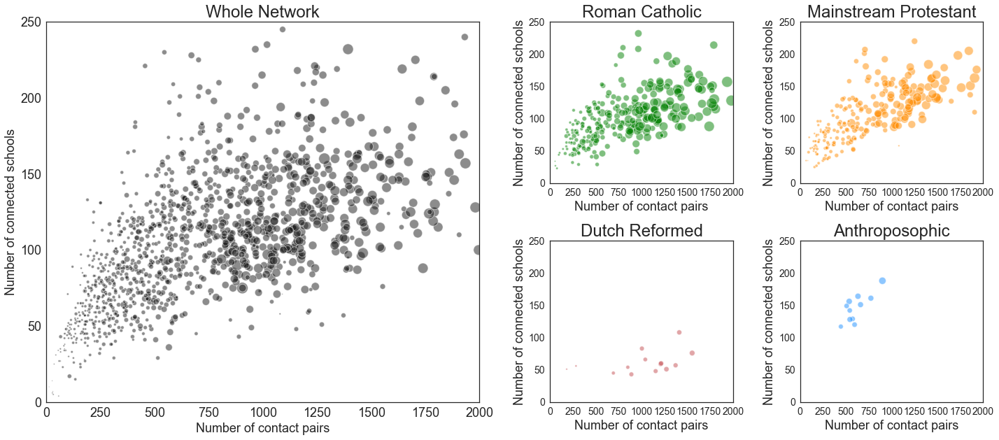

In [26]:
max_w = 2000.
sbn.set(style="white", color_codes=True)

font = {'size'   : 100}

matplotlib.rc('font', **font)

titles =['Whole Network', 'Roman Catholic', 'Mainstream Protestant', 'Dutch Reformed', 'Anthroposophic']

from matplotlib.gridspec import GridSpec
fig = plt.figure(figsize=[20,10])


gs1 = GridSpec(3, 3)
gs1.update(left=0.05, right=0.48, wspace=0.05)
ax1 = plt.subplot(gs1[:, :])


gs2 = GridSpec(40, 40)
gs2.update(left=0.55, right=0.98, hspace=0.05)
ax2 = plt.subplot(gs2[:-23, :-23])
ax3 = plt.subplot(gs2[:-23, -17:])
ax4 = plt.subplot(gs2[-17:, :-23])
ax5 = plt.subplot(gs2[-17:, -17:])



plot_data = all_frame.query('degree <= 250 and weighted_degree<=@max_w and BRIN in @sec_codes')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='k', ax=ax1, fontsize=18)

plot_data = all_frame.query('denominatie == "Rooms-Katholiek" and BRIN in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot( y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='Green',  ax=ax2, fontsize=14)
plot_data = all_frame.query('denominatie == "Protestants-Christelijk" and BRIN in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot( y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='DarkOrange',  ax=ax3, fontsize=14)


plot_data = all_frame.query('denominatie == "Reformatorisch" and BRIN in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='r',  ax=ax4, fontsize=14)
plot_data = all_frame.query('denominatie == "Antroposofisch" and BRIN in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='DodgerBlue',  ax=ax5, fontsize=14)

for i, ax in enumerate([ax1, ax2, ax3, ax4, ax5]):
    ax.set_xlabel('Number of contact pairs', fontsize='18')
    ax.set_ylabel('Number of connected schools', fontsize='18')
    ax.set_title(titles[i], fontsize='24')


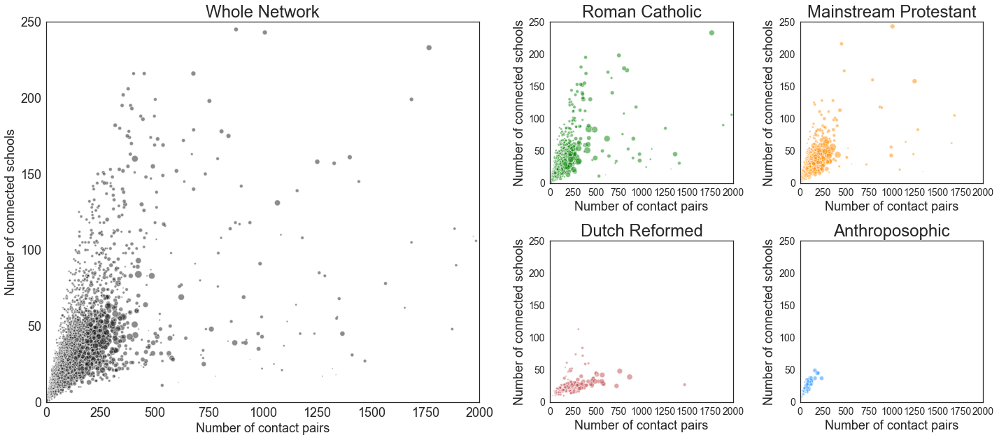

In [27]:
max_w = 2000.
sbn.set(style="white", color_codes=True)

font = {'size'   : 100}

matplotlib.rc('font', **font)

titles =['Whole Network', 'Roman Catholic', 'Mainstream Protestant', 'Dutch Reformed', 'Anthroposophic']

from matplotlib.gridspec import GridSpec
fig = plt.figure(figsize=[20,10])


gs1 = GridSpec(3, 3)
gs1.update(left=0.05, right=0.48, wspace=0.05)
ax1 = plt.subplot(gs1[:, :])


gs2 = GridSpec(40, 40)
gs2.update(left=0.55, right=0.98, hspace=0.05)
ax2 = plt.subplot(gs2[:-23, :-23])
ax3 = plt.subplot(gs2[:-23, -17:])
ax4 = plt.subplot(gs2[-17:, :-23])
ax5 = plt.subplot(gs2[-17:, -17:])



plot_data = all_frame.query('degree <= 250 and weighted_degree<=@max_w and BRIN not in @sec_codes')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='k', ax=ax1, fontsize=18)

plot_data = all_frame.query('denominatie == "Rooms-Katholiek" and BRIN not in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot( y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='Green',  ax=ax2, fontsize=14)
plot_data = all_frame.query('denominatie == "Protestants-Christelijk" and BRIN not in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot( y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='DarkOrange',  ax=ax3, fontsize=14)


plot_data = all_frame.query('denominatie == "Reformatorisch" and BRIN not in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='r',  ax=ax4, fontsize=14)
plot_data = all_frame.query('denominatie == "Antroposofisch" and BRIN not in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='DodgerBlue',  ax=ax5, fontsize=14)

for i, ax in enumerate([ax1, ax2, ax3, ax4, ax5]):
    ax.set_xlabel('Number of contact pairs', fontsize='18')
    ax.set_ylabel('Number of connected schools', fontsize='18')
    ax.set_title(titles[i], fontsize='24')


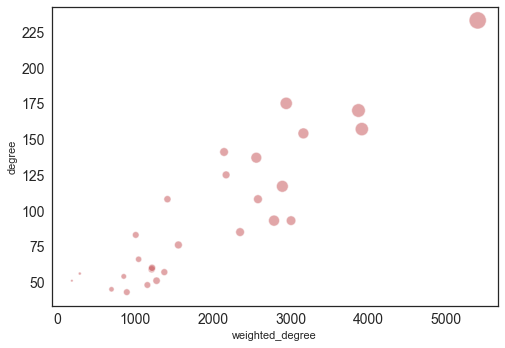

In [28]:
plot_data = all_frame.query('denominatie == "Reformatorisch" and BRIN in @sec_codes')
plot_data.plot(y='degree', x='weighted_degree', kind='scatter', s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='r', fontsize=14)

In [29]:
plot_data.median()

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:1019: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


bevoegd_gezag_nummer        41769.0
brinnummer                      NaN
cluster                         NaN
gem_code                      513.0
jaar_1                        183.0
jaar_2                        191.0
jaar_3                        125.0
jaar_4                         92.0
jaar_5                          0.0
jaar_6                          0.0
leerlingen                    599.0
lftd_10_jaar                    NaN
lftd_10tm12                     NaN
lftd_11_jaar                    NaN
lftd_12_jaar                    NaN
lftd_13_jaar                    NaN
lftd_13tm15                     NaN
lftd_14_jaar                    NaN
lftd_16tm20                     NaN
lftd_1tm6                       NaN
lftd_21tm27                     NaN
lftd_3_jaar                     NaN
lftd_4_jaar                     NaN
lftd_5_jaar                     NaN
lftd_6_jaar                     NaN
lftd_7_jaar                     NaN
lftd_7tm9                       NaN
lftd_8_jaar                 

In [30]:
all_frame.ggd.unique()

array(['GGD Noord- en Oost-Gelderland', 'GGD Zeeland',
       'GGD Midden-Nederland', 'GGD Hollands-Noorden',
       'GGD Brabant-Zuidoost', 'GGD Regio Nijmegen', 'GGD Drenthe',
       'GGD Rotterdam-Rijnmond', 'GGD Zuid-Holland-Zuid',
       'GGD Zuid-Holland-West', 'GGD Gooi en Vechtstreek',
       'GGD Regio Twente', 'GGD Hollands-Midden', 'GGD Groningen',
       'GGD Amsterdam', 'GGD Den Haag', 'GGD Kennemerland',
       'Hulpverlening Gelderland-Midden', 'GGD West-Brabant',
       'GG en GD Utrecht', 'GGD Frysl\x89n', 'GGD Flevoland',
       'GGD IJsselland', 'GGD Zaanstreek/Waterland',
       'GGD Hart voor Brabant', 'GGD Zuid-Limburg', 'GGD Limburg-Noord',
       'GGD Rivierenland'], dtype=object)

In [23]:
print 'mean degree secondary: ', all_frame.query('BRIN in @sec_codes').degree.mean()
print 'mean degree primary: ', all_frame.query('BRIN not in @sec_codes').degree.mean()


print 'mean degree secondary Katholiek: ', all_frame.query('denominatie == "Rooms-Katholiek" and BRIN in @sec_codes').degree.mean()
print 'mean degree primary Katholiek: ', all_frame.query('denominatie == "Rooms-Katholiek" and BRIN not in @sec_codes').degree.mean()

print 'mean degree secondary Christelijk: ',all_frame.query('denominatie == "Protestants-Christelijk" and BRIN in @sec_codes').degree.mean()
print 'mean degree primary Christelijk: ',all_frame.query('denominatie == "Protestants-Christelijk" and BRIN not in @sec_codes').degree.mean()


print 'mean degree secondary Reformatorisch: ',all_frame.query('denominatie == "Reformatorisch" and BRIN in @sec_codes').degree.mean()
print 'mean degree primary Reformatorisch: ',all_frame.query('denominatie == "Reformatorisch" and BRIN not in @sec_codes').degree.mean()


print 'mean degree secondary  Antroposofisch: ',all_frame.query('denominatie == "Antroposofisch" and BRIN in @sec_codes').degree.mean()
print 'mean degree primary  Antroposofisch: ',all_frame.query('denominatie == "Antroposofisch" and BRIN not in @sec_codes').degree.mean()


mean degree secondary:  109.656716418
mean degree primary:  27.4963089902
mean degree secondary Katholiek:  103.383561644
mean degree primary Katholiek:  26.2113309353
mean degree secondary Christelijk:  105.408333333
mean degree primary Christelijk:  24.9871451527
mean degree secondary Reformatorisch:  97.962962963
mean degree primary Reformatorisch:  26.1270718232
mean degree secondary  Antroposofisch:  145.909090909
mean degree primary  Antroposofisch:  25.7142857143


In [26]:
print 'mean degree secondary: ', all_frame.query('BRIN in @sec_codes').weighted_degree.mean()
print 'mean degree primary: ', all_frame.query('BRIN not in @sec_codes').weighted_degree.mean()

print 'mean degree secondary Katholiek: ', all_frame.query('denominatie == "Rooms-Katholiek" and BRIN in @sec_codes and degree <= @max_d and weighted_degree<=@max_w').weighted_degree.mean()
print 'mean degree primary Katholiek: ', all_frame.query('denominatie == "Rooms-Katholiek" and BRIN not in @sec_codes and degree <= @max_d and weighted_degree<=@max_w').weighted_degree.mean()

print 'mean degree secondary Christelijk: ',all_frame.query('denominatie == "Protestants-Christelijk" and BRIN in @sec_codes and degree <= @max_d and weighted_degree<=@max_w').weighted_degree.mean()
print 'mean degree primary Christelijk: ',all_frame.query('denominatie == "Protestants-Christelijk" and BRIN not in @sec_codes and degree <= @max_d and weighted_degree<=@max_w').weighted_degree.mean()

print 'mean degree secondary Reformatorisch: ',all_frame.query('denominatie == "Reformatorisch" and BRIN in @sec_codes and degree <= @max_d and weighted_degree<=@max_w').weighted_degree.mean()
print 'mean degree primary Reformatorisch: ',all_frame.query('denominatie == "Reformatorisch" and BRIN not in @sec_codes and degree <= @max_d and weighted_degree<=@max_w').weighted_degree.mean()

print 'mean degree secondary  Antroposofisch: ',all_frame.query('denominatie == "Antroposofisch" and BRIN in @sec_codes and degree <= @max_d and weighted_degree<=@max_w').weighted_degree.mean()
print 'mean degree primary  Antroposofisch: ',all_frame.query('denominatie == "Antroposofisch" and BRIN not in @sec_codes and degree <= @max_d and weighted_degree<=@max_w').weighted_degree.mean()


mean degree secondary:  813.934328358
mean degree primary:  122.077511205
mean degree secondary Katholiek:  833.103092784
mean degree primary Katholiek:  117.955035971
mean degree secondary Christelijk:  795.929166667
mean degree primary Christelijk:  106.68880557
mean degree secondary Reformatorisch:  1995.81481481
mean degree primary Reformatorisch:  260.867403315
mean degree secondary  Antroposofisch:  609.818181818
mean degree primary  Antroposofisch:  83.6428571429


In [33]:
print 'mean degree secondary: ', all_frame.query('BRIN in @sec_codes').degree.median()
print 'mean degree primary: ', all_frame.query('BRIN not in @sec_codes').degree.median()


print 'mean degree secondary Katholiek: ', all_frame.query('denominatie == "Rooms-Katholiek" and BRIN in @sec_codes').degree.median()
print 'mean degree primary Katholiek: ', all_frame.query('denominatie == "Rooms-Katholiek" and BRIN not in @sec_codes').degree.median()

print 'mean degree secondary Christelijk: ',all_frame.query('denominatie == "Protestants-Christelijk" and BRIN in @sec_codes').degree.median()
print 'mean degree primary Christelijk: ',all_frame.query('denominatie == "Protestants-Christelijk" and BRIN not in @sec_codes').degree.median()


print 'mean degree secondary Reformatorisch: ',all_frame.query('denominatie == "Reformatorisch" and BRIN in @sec_codes').degree.median()
print 'mean degree primary Reformatorisch: ',all_frame.query('denominatie == "Reformatorisch" and BRIN not in @sec_codes').degree.median()


print 'mean degree secondary  Antroposofisch: ',all_frame.query('denominatie == "Antroposofisch" and BRIN in @sec_codes').degree.median()
print 'mean degree primary  Antroposofisch: ',all_frame.query('denominatie == "Antroposofisch" and BRIN not in @sec_codes').degree.median()


mean degree secondary:  103.0
mean degree primary:  22.0
mean degree secondary Katholiek:  97.0
mean degree primary Katholiek:  21.0
mean degree secondary Christelijk:  101.5
mean degree primary Christelijk:  21.0
mean degree secondary Reformatorisch:  85.0
mean degree primary Reformatorisch:  23.0
mean degree secondary  Antroposofisch:  149.0
mean degree primary  Antroposofisch:  26.0


In [34]:
print 'mean degree secondary: ', all_frame.query('BRIN in @sec_codes').weighted_degree.median()
print 'mean degree primary: ', all_frame.query('BRIN not in @sec_codes').weighted_degree.median()

print 'mean degree secondary Katholiek: ', all_frame.query('denominatie == "Rooms-Katholiek" and BRIN in @sec_codes').weighted_degree.median()
print 'mean degree primary Katholiek: ', all_frame.query('denominatie == "Rooms-Katholiek" and BRIN not in @sec_codes').weighted_degree.median()

print 'mean degree secondary Christelijk: ',all_frame.query('denominatie == "Protestants-Christelijk" and BRIN in @sec_codes').weighted_degree.median()
print 'mean degree primary Christelijk: ',all_frame.query('denominatie == "Protestants-Christelijk" and BRIN not in @sec_codes').weighted_degree.median()

print 'mean degree secondary Reformatorisch: ',all_frame.query('denominatie == "Reformatorisch" and BRIN in @sec_codes').weighted_degree.median()
print 'mean degree primary Reformatorisch: ',all_frame.query('denominatie == "Reformatorisch" and BRIN not in @sec_codes').weighted_degree.median()

print 'mean degree secondary  Antroposofisch: ',all_frame.query('denominatie == "Antroposofisch" and BRIN in @sec_codes').weighted_degree.median()
print 'mean degree primary  Antroposofisch: ',all_frame.query('denominatie == "Antroposofisch" and BRIN not in @sec_codes').weighted_degree.median()


mean degree secondary:  660.0
mean degree primary:  88.0
mean degree secondary Katholiek:  752.5
mean degree primary Katholiek:  88.0
mean degree secondary Christelijk:  672.0
mean degree primary Christelijk:  86.0
mean degree secondary Reformatorisch:  1553.0
mean degree primary Reformatorisch:  230.0
mean degree secondary  Antroposofisch:  574.0
mean degree primary  Antroposofisch:  81.0


In [27]:
pop_data = pd.read_csv('population_data.csv')

In [28]:
pop_data = pop_data.rename(columns = {'PostcodesOp1Januari':'PC4'})

In [29]:
all_frame['PC4'] = [p[:4] for p in all_frame['pc6']]

In [30]:
import geopandas as gpd

In [31]:
NL_pc4_shapes = gpd.read_file("/Users/LAPT0084/Documents/PhD/Objective 4 -  Integration through schools/Dutch data/openpc4nl2015landonly/PC4_Nederland_2015.shp")

In [32]:
NL_pc4_shapes = NL_pc4_shapes.merge(pop_data[['PC4', 'TotaalMannenEnVrouwen_1']], on='PC4')

In [33]:
NL_pc4_shapes['density'] = NL_pc4_shapes.TotaalMannenEnVrouwen_1 / NL_pc4_shapes.Shape_Area


In [34]:
all_frame = all_frame.convert_objects(convert_numeric=True)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  """Entry point for launching an IPython kernel.


In [35]:
all_frame = all_frame.merge(pd.DataFrame(NL_pc4_shapes[['PC4', 'density']], dtype='float'), on='PC4')

In [36]:
all_frame['wd_per_kid'] = all_frame.weighted_degree/all_frame.leerlingen

In [37]:
all_frame['d_per_kid'] = all_frame.degree/all_frame.leerlingen

In [38]:
pop_data_kids = pd.DataFrame(pop_data[['k_0Tot5Jaar_2','k_5Tot10Jaar_3','k_10Tot15Jaar_4']].sum(axis=1), columns=['kids'])
pop_data_kids['PC4'] = pop_data['PC4']

In [39]:
NL_pc4_shapes = NL_pc4_shapes.merge(pop_data_kids, on='PC4')
NL_pc4_shapes['kids_density'] = NL_pc4_shapes.kids / NL_pc4_shapes.Shape_Area


all_frame = all_frame.merge(pd.DataFrame(NL_pc4_shapes[['PC4', 'kids_density']], dtype='float'), on='PC4')



In [40]:
all_frame = all_frame.convert_objects(convert_numeric=True)

/Users/LAPT0084/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  """Entry point for launching an IPython kernel.


ValueError: scatter requires x column to be numeric

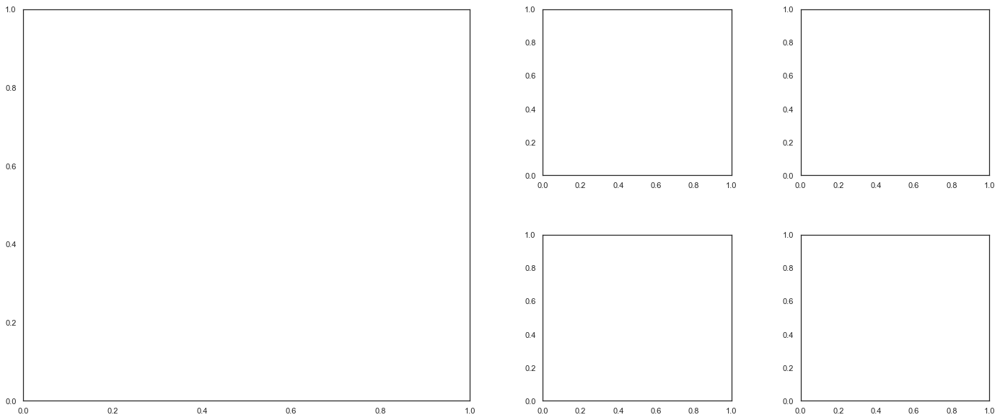

In [41]:
max_w = 0.001
sbn.set(style="white", color_codes=True)

font = {'size'   : 100}

matplotlib.rc('font', **font)

titles =['Whole Network', 'Roman Catholic', 'Mainstream Protestant', 'Dutch Reformed', 'Anthroposophic']

from matplotlib.gridspec import GridSpec
fig = plt.figure(figsize=[20,10])


gs1 = GridSpec(3, 3)
gs1.update(left=0.05, right=0.48, wspace=0.05)
ax1 = plt.subplot(gs1[:, :])


gs2 = GridSpec(40, 40)
gs2.update(left=0.55, right=0.98, hspace=0.05)
ax2 = plt.subplot(gs2[:-23, :-23])
ax3 = plt.subplot(gs2[:-23, -17:])
ax4 = plt.subplot(gs2[-17:, :-23])
ax5 = plt.subplot(gs2[-17:, -17:])



plot_data = all_frame.query('degree <= 250 and weighted_degree<=@max_w and BRIN not in @sec_codes')
plot_data.plot(y='degree', x='kids_density', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='k', ax=ax1, fontsize=18)

plot_data = all_frame.query('denominatie == "Rooms-Katholiek" and BRIN not in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot( y='degree', x='kids_density', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='Green',  ax=ax2, fontsize=14)
plot_data = all_frame.query('denominatie == "Protestants-Christelijk" and BRIN not in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot( y='degree', x='kids_density', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='DarkOrange',  ax=ax3, fontsize=14)


plot_data = all_frame.query('denominatie == "Reformatorisch" and BRIN not in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot(y='degree', x='kids_density', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='r',  ax=ax4, fontsize=14)
plot_data = all_frame.query('denominatie == "Antroposofisch" and BRIN not in @sec_codes').query('degree <= 250 and weighted_degree<=@max_w')
plot_data.plot(y='degree', x='kids_density', kind='scatter', ylim=[0,250], xlim=[0,max_w], s=plot_data.leerlingen*0.1, edgecolor="w", linewidth=1, alpha=0.5, color='DodgerBlue',  ax=ax5, fontsize=14)

for i, ax in enumerate([ax1, ax2, ax3, ax4, ax5]):
    ax.set_xlabel('Number of contact pairs', fontsize='18')
    ax.set_ylabel('Number of connected schools', fontsize='18')
    ax.set_title(titles[i], fontsize='24')


In [287]:
all_frame.columns

Index([u'bevoegd_gezag_nummer', u'brin_nummer', u'brinnummer', u'cluster',
       u'denominatie', u'gem_code', u'gemeentenaam', u'geocod', u'ggd',
       u'huisnummer_toevoeging', u'internetadres', u'jaar_1', u'jaar_2',
       u'jaar_3', u'jaar_4', u'jaar_5', u'jaar_6', u'leerlingen',
       u'lftd_10_jaar', u'lftd_10tm12', u'lftd_11_jaar', u'lftd_12_jaar',
       u'lftd_13_jaar', u'lftd_13tm15', u'lftd_14_jaar', u'lftd_16tm20',
       u'lftd_1tm6', u'lftd_21tm27', u'lftd_3_jaar', u'lftd_4_jaar',
       u'lftd_5_jaar', u'lftd_6_jaar', u'lftd_7_jaar', u'lftd_7tm9',
       u'lftd_8_jaar', u'lftd_9_jaar', u'objectid', u'onderwijsstructuur',
       u'opmerking_geocode', u'pc6', u'plaatsnaam', u'provincie',
       u'soort_primair_onderwijs', u'straatnaam', u'vest_perbrin',
       u'vestigingsnaam', u'BRIN', u'xcoord', u'ycoord', u'weighted_degree',
       u'degree', u'PC4', u'density', u'wd_per_kid', u'd_per_kid',
       u'kids_density'],
      dtype='object')

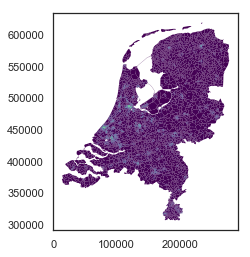

In [42]:
NL_pc4_shapes.plot('density', cmap='viridis', linewidth=0.)

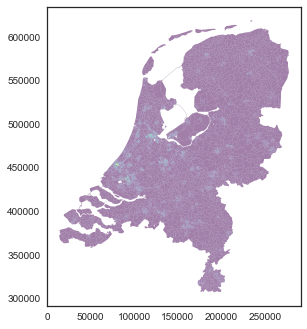

In [170]:
NL_pc4_shapes.plot('kids_density', cmap='viridis', linewidth=0.)

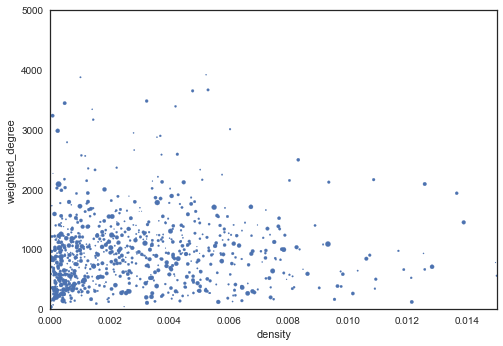

In [388]:
all_frame.query('BRIN in @vo_frame.vestigingsnummer').groupby('PC4').max().plot(x='density', y='weighted_degree', kind='scatter', 
                                                                                s=all_frame.query('BRIN in @vo_frame.vestigingsnummer').leerlingen/100,  
                                                                                xlim=[0,0.015], ylim=[0,5000])

In [329]:
len(vo_frame)

1359

In [330]:
len(so_frame)

827

In [331]:
so_frame.columns

Index([u'objectid', u'bevoegd_gezag_nummer', u'brinnummer',
       u'vestigingsnummer', u'vestigingsnaam', u'denominatie',
       u'soort_primair_onderwijs', u'cluster', u'straatnaam',
       u'huisnummer_toevoeging', u'pc6', u'plaatsnaam', u'gem_code',
       u'gemeentenaam', u'provincie', u'ggd', u'internetadres', u'xcoord',
       u'ycoord', u'geocod', u'opmerking_geocode', u'leerlingen', u'lftd_1tm6',
       u'lftd_7tm9', u'lftd_10tm12', u'lftd_13tm15', u'lftd_16tm20',
       u'lftd_21tm27'],
      dtype='object')

(array([  8.94800000e+03,   6.80000000e+01,   2.90000000e+01,
          1.20000000e+01,   7.00000000e+00,   1.00000000e+00,
          4.00000000e+00,   6.00000000e+00,   0.00000000e+00,
          1.00000000e+00]),
 array([  8.89235857e-05,   5.31383056e-04,   9.73842527e-04,
          1.41630200e-03,   1.85876147e-03,   2.30122094e-03,
          2.74368041e-03,   3.18613988e-03,   3.62859935e-03,
          4.07105882e-03,   4.51351829e-03]),
 <a list of 10 Patch objects>)

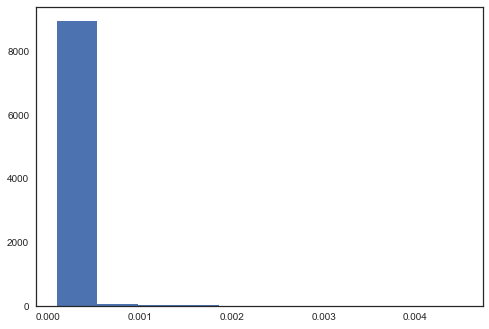

In [347]:
plt.hist(nx.pagerank(transnet.trans_net, weight='weight').values())

array(['GGD Noord- en Oost-Gelderland', 'GGD Zeeland',
       'GGD Midden-Nederland', 'GGD Hollands-Noorden',
       'GGD Brabant-Zuidoost', 'GGD Regio Nijmegen', 'GGD Drenthe',
       'GGD Rotterdam-Rijnmond', 'GGD Zuid-Holland-Zuid',
       'GGD Zuid-Holland-West', 'GGD Gooi en Vechtstreek',
       'GGD Regio Twente', 'GGD Hollands-Midden', 'GGD Groningen',
       'GGD Amsterdam', 'GGD Den Haag', 'GGD Kennemerland',
       'Hulpverlening Gelderland-Midden', 'GGD West-Brabant',
       'GG en GD Utrecht', 'GGD Frysl\x89n', 'GGD Flevoland',
       'GGD IJsselland', 'GGD Zaanstreek/Waterland',
       'GGD Hart voor Brabant', 'GGD Zuid-Limburg', 'GGD Limburg-Noord',
       'GGD Rivierenland'], dtype=object)

In [43]:
import network_analysis as nal

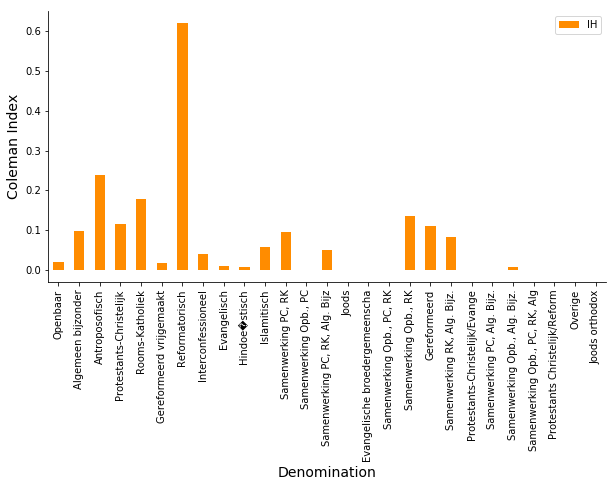

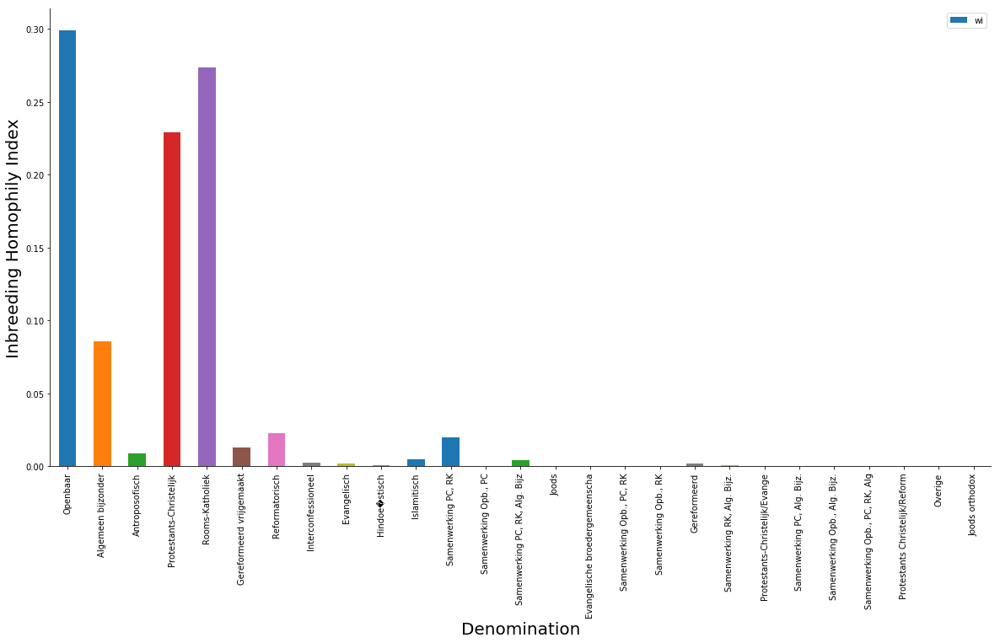

In [55]:
hom = nal.calculate_homophily(transnet.data_net, transnet.school_data)

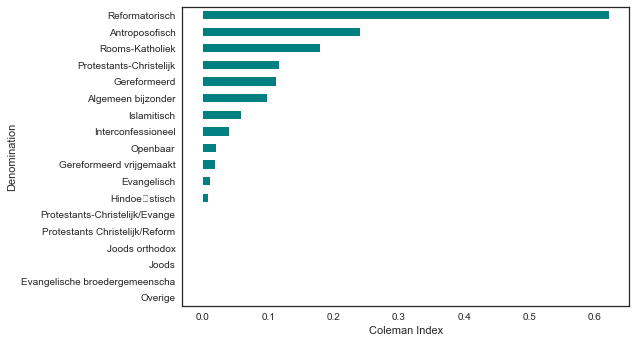

In [29]:
unique_denoms = [d for d in hom.Denomination if 'Samen' not in d]
ax = hom.sort_values('IH').query('Denomination in @unique_denoms').set_index('Denomination').IH.plot('barh', color='Teal')
ax.set_xlabel('Coleman Index')

(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]),
 <a list of 8 Text xticklabel objects>)

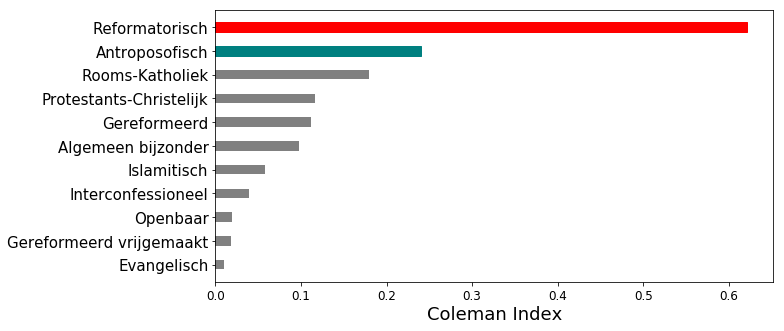

In [253]:
unique_denoms = [d for d in hom.Denomination if 'Samen' not in d]

fig = plt.figure(figsize=[10,5])
ax = fig.add_subplot(111)
barlist = plt.barh(range(11), 
                   np.array(hom.sort_values('IH').query('Denomination in @unique_denoms').set_index('Denomination').IH)[-11:], 
                   color='Grey', height=0.4)
ax.set_xlabel('Coleman Index', fontsize=18)
barlist[-1].set_color('r')
barlist[-2].set_color('Teal')
#barlist[-2].set_color('r')
ax.set_yticks(range(11))
ax.set_yticklabels(np.array(hom.sort_values('IH').query('Denomination in @unique_denoms').Denomination)[-11:], fontsize=15)
plt.xticks(fontsize=12)

(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]),
 <a list of 8 Text xticklabel objects>)

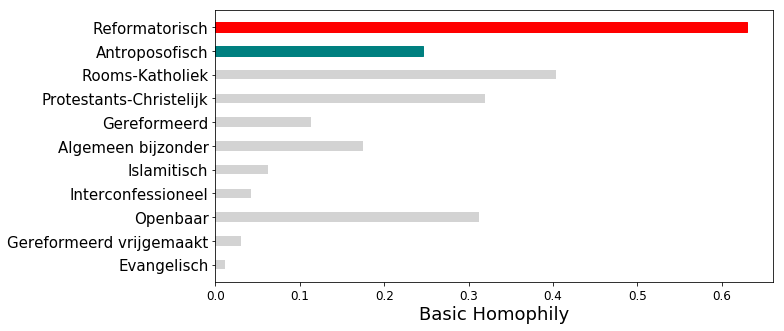

In [252]:
unique_denoms = [d for d in hom.Denomination if 'Samen' not in d]

fig = plt.figure(figsize=[10,5])
ax = fig.add_subplot(111)
barlist = plt.barh(range(11), 
                   np.array(hom.sort_values('IH').query('Denomination in @unique_denoms').set_index('Denomination').Hi)[-11:], 
                   color='LightGrey', height=0.4)
ax.set_xlabel('Basic Homophily', fontsize=18)
barlist[-1].set_color('r')
barlist[-2].set_color('Teal')
ax.set_yticks(range(11))
ax.set_yticklabels(np.array(hom.sort_values('IH').query('Denomination in @unique_denoms').Denomination)[-11:], fontsize=15)
plt.xticks(fontsize=12)

In [31]:
list(hom.sort_values('IH').query('Denomination in @unique_denoms').Denomination)

['Overige',
 'Evangelische broedergemeenscha',
 'Joods',
 'Joods orthodox',
 'Protestants Christelijk/Reform',
 'Protestants-Christelijk/Evange',
 'Hindoe\x95stisch',
 'Evangelisch',
 'Gereformeerd vrijgemaakt',
 'Openbaar',
 'Interconfessioneel',
 'Islamitisch',
 'Algemeen bijzonder',
 'Gereformeerd',
 'Protestants-Christelijk',
 'Rooms-Katholiek',
 'Antroposofisch',
 'Reformatorisch']

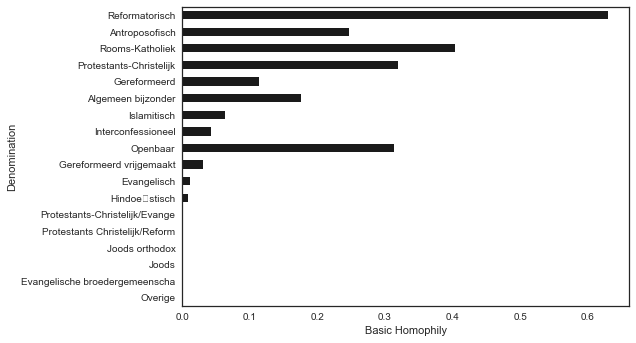

In [32]:
unique_denoms = [d for d in hom.Denomination if 'Samen' not in d]
ax = hom.sort_values('IH').query('Denomination in @unique_denoms').set_index('Denomination').Hi.plot('barh', color='k')
ax.set_xlabel('Basic Homophily')

In [39]:
hom.sort_values('IH', ascending=False).query('Denomination in @unique_denoms').drop('wi', axis=1)

,Denomination,Hi,IH
6,Reformatorisch,0.629629,0.621062
2,Antroposofisch,0.246438,0.239744
4,Rooms-Katholiek,0.403496,0.178959
3,Protestants-Christelijk,0.318992,0.116696
18,Gereformeerd,0.113148,0.111409
1,Algemeen bijzonder,0.175166,0.097899
10,Islamitisch,0.062285,0.057778
7,Interconfessioneel,0.041774,0.039582
0,Openbaar,0.312790,0.019490
5,Gereformeerd vrijgemaakt,0.030618,0.018131


In [61]:
reload(nal)

<module 'network_analysis' from '/Users/LAPT0084/Documents/PhD/Objective 4 -  Integration through schools/DOS_code/School_Network_Analysis/network_analysis.py'>

In [59]:
len(transnet.data_net.nodes())

9200

In [62]:
gd_ref, wd_ref, ud_ref, gd_nre, wd_nre, ud_nre = nal.compare_denom(transnet.data_net, transnet.school_data,'Reformatorisch', sample=30)

In [63]:
gd_ant, wd_ant, ud_ant, gd_nan, wd_nan, ud_nan = nal.compare_denom(transnet.data_net, transnet.school_data, 'Antroposofisch', sample=30)

In [64]:
distance_ratio_ant = wd_ant/(0.001 * gd_ant + 1.e-10)
distance_ratio_notant = wd_nan/(0.001 *gd_nan + 1.e-10)
distance_ratio_ref = wd_ref/(0.001 *gd_ref + 1.e-10)
distance_ratio_notref = wd_nre/(0.001 *gd_nre + 1.e-10)

In [67]:
mean_ant = distance_ratio_ant.mean()
lower_ant = st.scoreatpercentile(distance_ratio_ant,25)
upper_ant = st.scoreatpercentile(distance_ratio_ant,75)

mean_nan = distance_ratio_notant.mean()
lower_nan = st.scoreatpercentile(distance_ratio_notant,25)
upper_nan = st.scoreatpercentile(distance_ratio_notant,75)

In [68]:
print mean_ant, lower_ant, upper_ant
print mean_nan, lower_nan, upper_nan

4.55193538219 1.24008343089 3.03836787324
6.20145367351 2.09786583048 6.45626372425


In [69]:
mean_ref = st.scoreatpercentile(distance_ratio_ref, 50 )
lower_ref = st.scoreatpercentile(distance_ratio_ref,25)
upper_ref = st.scoreatpercentile(distance_ratio_ref,75)

mean_nre = st.scoreatpercentile(distance_ratio_notref,50)
lower_nre = st.scoreatpercentile(distance_ratio_notref,25)
upper_nre = st.scoreatpercentile(distance_ratio_notref,75)

In [70]:
 yerr = np.array([[lower_ref, upper_ref],[lower_nre, upper_nre],[lower_ant, upper_ant],[lower_nan, upper_nan]])

In [71]:
yerr

array([[ 0.22053314,  0.70968506],
       [ 2.67087415,  9.53435192],
       [ 1.24008343,  3.03836787],
       [ 2.09786583,  6.45626372]])

In [72]:
means = np.array([mean_ref, mean_nre, mean_ant, mean_nan])
means

array([ 0.37721938,  5.01153842,  4.55193538,  6.20145367])

In [73]:
np.abs(means - yerr.T)

array([[ 0.15668625,  2.34066426,  3.31185195,  4.10358784],
       [ 0.33246568,  4.5228135 ,  1.51356751,  0.25481005]])

<ErrorbarContainer object of 3 artists>

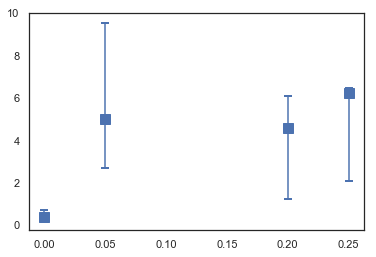

In [74]:
plt.errorbar([0,0.05, 0.2, 0.25], [mean_ref, mean_nre, mean_ant, mean_nan], yerr = np.abs(means - yerr.T), marker='s',ms=10, linestyle='', capsize=4, capthick=2)

(array([ 0,  5, 10, 15, 20, 25]), <a list of 6 Text yticklabel objects>)

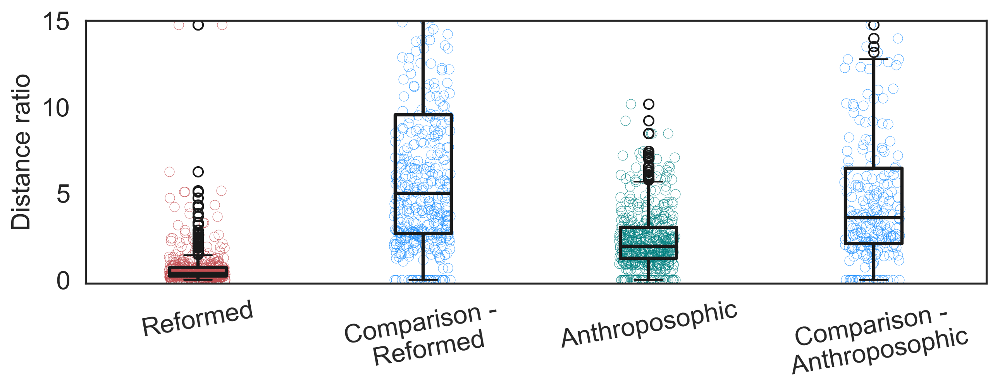

In [76]:
sbn.set(style='white')
plt.figure(figsize=[10,3], dpi=300)

randomx_r = np.random.random(len(distance_ratio_ref))
randomx_nr = np.random.random(len(distance_ratio_notref))
randomx_a = np.random.random(len(distance_ratio_ant))
randomx_na = np.random.random(len(distance_ratio_notant))

plt.plot(0.87 + randomx_r*0.25, distance_ratio_ref, 'o', mec='r', mew=0.2, mfc='none')
plt.plot(1.87 + randomx_nr*0.25, distance_ratio_notref, 'o', mec='DodgerBlue', mew=0.2, mfc='none')
plt.plot(2.87 + randomx_a*0.25, distance_ratio_ant, 'o', mec='Teal', mew=0.2, mfc='none')
plt.plot(3.87 + randomx_na*0.25, distance_ratio_notant, 'o', mec='DodgerBlue', mew=0.2, mfc='none')

boxprops = dict(linewidth=2, color='k')
whiskerprops = dict(linewidth=2, color='k')
medianprops = dict(linewidth=2, color='k')
plt.boxplot([distance_ratio_ref, distance_ratio_notref, distance_ratio_ant, distance_ratio_notant], widths=0.25,boxprops=boxprops, whiskerprops=whiskerprops,medianprops=medianprops )

plt.yticks(range(0,26,5), fontsize=12)
plt.ylabel('Distance ratio', fontsize=16)
plt.xticks([1,2,3,4], ['Reformed', 'Comparison -\n Reformed', 'Anthroposophic', 'Comparison -\n Anthroposophic'], fontsize=16, rotation='10')
plt.ylim([-0.2,15])
plt.yticks(fontsize=16)




In [80]:
distance_ratio_ref.max()

49.92960780791546

In [78]:
g,w,u = nal.distance_compare(transnet.data_net, transnet.school_data, np.random.choice(transnet.nodelist,30),weight='inv_weight')

In [81]:
st.describe(np.array(w)/(0.001 * np.array(g)+1.e-20))

DescribeResult(nobs=465, minmax=(0.0, 108.49788304110471), mean=2.85245785933844, variance=58.51975376673562, skewness=9.730388050758668, kurtosis=117.091533849374)

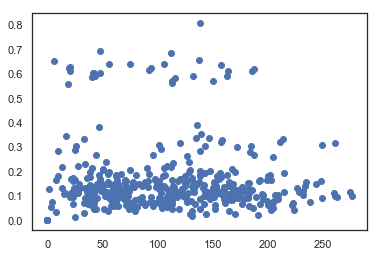

In [82]:
plt.plot(g, w, 'o')

In [83]:
grc,wrc,urc = nal.distance_compare(transnet.data_net, transnet.school_data, np.random.choice(np.array(transnet.school_data.query('Denomination == "Rooms-Katholiek"').BRIN),30),weight='inv_weight')

In [84]:
gpc,wpc,upc = nal.distance_compare(transnet.data_net, transnet.school_data, np.random.choice(np.array(transnet.school_data.query('Denomination == "Protestants-Christelijk"').BRIN),30),weight='inv_weight')

In [209]:
st.describe(np.array(wrc)/(0.001 * np.array(grc)+1.e-20))

DescribeResult(nobs=465, minmax=(0.0, 245.09767492095858), mean=3.749172431072969, variance=159.58866059614115, skewness=15.580129255449213, kurtosis=286.7598145617629)

In [210]:
st.describe(np.array(wpc)/(0.001 * np.array(gpc)+1.e-20))

DescribeResult(nobs=465, minmax=(0.0, 141.26716931781576), mean=3.1742637406219236, variance=70.204729485673, skewness=11.33316795917774, kurtosis=164.90215100288881)

In [217]:
reload(nal)

<module 'network_analysis' from '/Users/LAPT0084/Documents/PhD/Objective 4 -  Integration through schools/DOS_code/School_Network_Analysis/network_analysis.py'>

In [214]:
g,w,u = nal.distance_compare(transnet.data_net, transnet.school_data, np.random.choice(transnet.nodelist,10),weight='inv_weight')

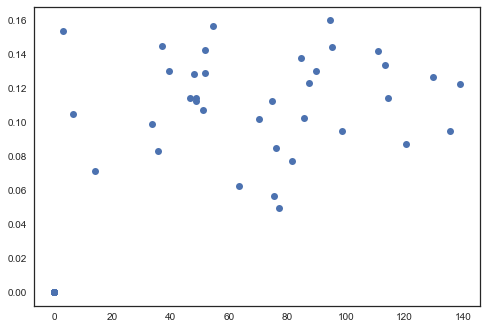

In [215]:
plt.plot(g, w, 'o')

In [243]:
g,w,u = nal.distance_compare(transnet.data_net, transnet.school_data, transnet.nodelist,weight='inv_weight', sample=5)

[array(['02YT00', '25DA00'],
      dtype='|S6'), array(['18AC00', '30BB00'],
      dtype='|S6'), array(['07YA00', '23HU00'],
      dtype='|S6'), array(['24PY00', '17JH01'],
      dtype='|S6'), array(['07VS00', '10VP00'],
      dtype='|S6')]


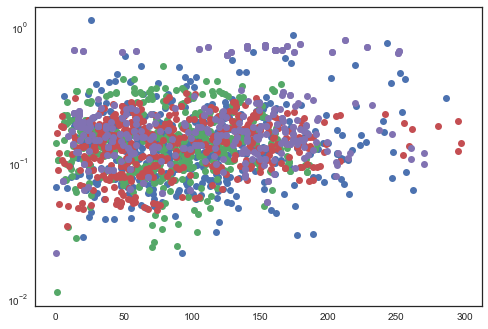

In [233]:
plt.plot(g, w, 'o')
plt.plot(grc, wrc,'o')
plt.plot(gpc, wpc,'o')
plt.plot(gd_ant, wd_ant,'o')
plt.yscale('log')

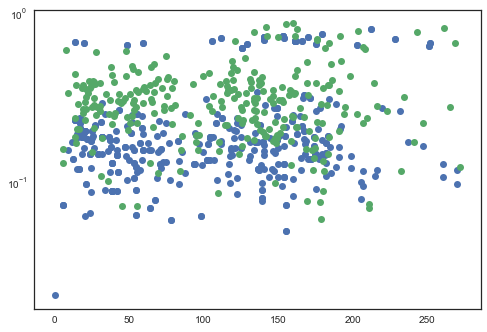

In [234]:
plt.plot(gd_ant, wd_ant,'o')
plt.plot(gd_nan, wd_nan,'o')
plt.yscale('log')

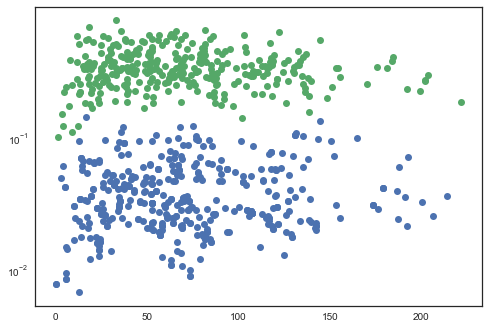

In [261]:
plt.plot(gd_ref, wd_ref,'o')
plt.plot(gd_nre, wd_nre,'o')
plt.yscale('log')

In [270]:
st.describe(np.array(wd_ref)/(0.001 * np.array(gd_ref)+1.e-20))

DescribeResult(nobs=465, minmax=(0.0, 17.37218265253306), mean=0.9792827955761214, variance=3.1222430923820648, skewness=6.238975338046971, kurtosis=47.502846788289055)

In [258]:
reload(nal)

<module 'network_analysis' from '/Users/LAPT0084/Documents/PhD/Objective 4 -  Integration through schools/DOS_code/School_Network_Analysis/network_analysis.py'>

pairs generated
con_pairs generated
pairs provided
[array(['04FT00', '08CM01'], dtype=object), array(['21OM00', '04NH00'], dtype=object), array(['23FE00', '06QZ00'], dtype=object), array(['09NN00', '06AF00'], dtype=object), array(['06UT00', '06TT00'], dtype=object), array(['07CC00', '06UF00'], dtype=object), array(['04BK00', '06ZZ00'], dtype=object), array(['16TV01', '08SE00'], dtype=object), array(['07CX00', '06RF00'], dtype=object), array(['06UC00', '07EX00'], dtype=object), array(['06RG00', '00CB00'], dtype=object), array(['06UQ00', '16TS03'], dtype=object), array(['04FT00', '24RU00'], dtype=object), array(['06YJ00', '06UT00'], dtype=object), array(['04NH00', '03ZE00'], dtype=object), array(['06PV00', '06TT00'], dtype=object), array(['04BT00', '00CB01'], dtype=object), array(['06XQ00', '09PH00'], dtype=object), array(['00CB02', '07CC00'], dtype=object), array(['07CP00', '04NH00'], dtype=object), array(['16TS02', '10KE00'], dtype=object), array(['16TV01', '10KE00'], dtype=object), ar

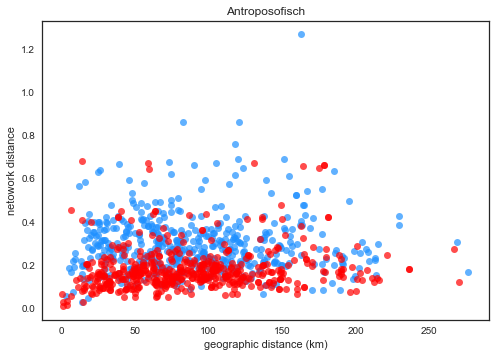

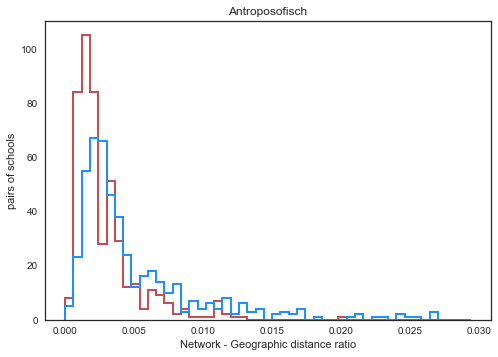

In [255]:
gd_ant_p, wd_ant_p, ud_ant_p, gd_nan_p, wd_nan_p, ud_nan_p = nal.compare_denom_prepairs(transnet.data_net, transnet.school_data, 'Antroposofisch', sample=500)

pairs generated
con_pairs generated
pairs provided
[array(['05RG00', '06FA00'], dtype=object), array(['23DU00', '07CO00'], dtype=object), array(['06NX00', '04UK00'], dtype=object), array(['04RC00', '00IM00'], dtype=object), array(['07XO00', '04PK00'], dtype=object), array(['04MJ00', '03OA00'], dtype=object), array(['03WO01', '03JY01'], dtype=object), array(['03XE00', '07MF00'], dtype=object), array(['06FI00', '22LT00'], dtype=object), array(['29TM00', '03YZ00'], dtype=object), array(['07KB00', '03JY06'], dtype=object), array(['19VI00', '01RL00'], dtype=object), array(['07KY00', '03WO01'], dtype=object), array(['00PG04', '03WO02'], dtype=object), array(['07LR00', '04EW00'], dtype=object), array(['07XH00', '03WO01'], dtype=object), array(['05TG00', '00PG02'], dtype=object), array(['03GD00', '07NE00'], dtype=object), array(['26NU00', '07OE00'], dtype=object), array(['06FJ00', '24RX00'], dtype=object), array(['03TD00', '11CA00'], dtype=object), array(['24EC00', '04RL00'], dtype=object), ar

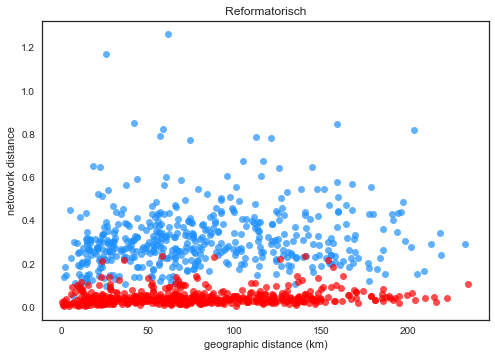

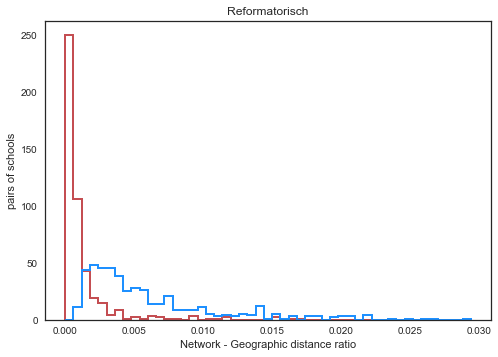

In [256]:
gd_ref_p, wd_ref_p, ud_ref_p, gd_nre_p, wd_nre_p, ud_nre_p = nal.compare_denom_prepairs(transnet.data_net, transnet.school_data, 'Reformatorisch', sample=500)

In [257]:
g,w,u = nal.distance_compare(transnet.data_net, transnet.school_data, transnet.nodelist,weight='inv_weight', sample=500)

selecting pairs
[array(['08ER00', '09JO00'],
      dtype='|S6'), array(['17DN00', '08JM00'],
      dtype='|S6'), array(['16AB00', '17RK00'],
      dtype='|S6'), array(['12BH00', '13DT00'],
      dtype='|S6'), array(['00ZV06', '03ZD00'],
      dtype='|S6'), array(['04RF00', '13XM00'],
      dtype='|S6'), array(['08IT00', '18BL00'],
      dtype='|S6'), array(['02GK00', '25GV08'],
      dtype='|S6'), array(['09KL00', '05GR00'],
      dtype='|S6'), array(['04KT00', '15PJ01'],
      dtype='|S6'), array(['05IS00', '12UL00'],
      dtype='|S6'), array(['17IR00', '18CH02'],
      dtype='|S6'), array(['09DN00', '12LF00'],
      dtype='|S6'), array(['14BV00', '03UA00'],
      dtype='|S6'), array(['20TW01', '02ZY00'],
      dtype='|S6'), array(['07RJ00', '26HP00'],
      dtype='|S6'), array(['07BI00', '09KZ00'],
      dtype='|S6'), array(['20YF00', '26NE00'],
      dtype='|S6'), array(['15FH00', '01PD00'],
      dtype='|S6'), array(['09NW00', '04MY00'],
      dtype='|S6'), array(['18KP00', '07XQ0

In [259]:
grc,wrc,urc = nal.distance_compare(transnet.data_net, transnet.school_data, np.array(transnet.school_data.query('Denomination == "Rooms-Katholiek"').BRIN),weight='inv_weight', sample=500)

selecting pairs


In [260]:
gpc,wpc,upc = nal.distance_compare(transnet.data_net, transnet.school_data, np.array(transnet.school_data.query('Denomination == "Protestants-Christelijk"').BRIN),weight='inv_weight', sample=500)

selecting pairs


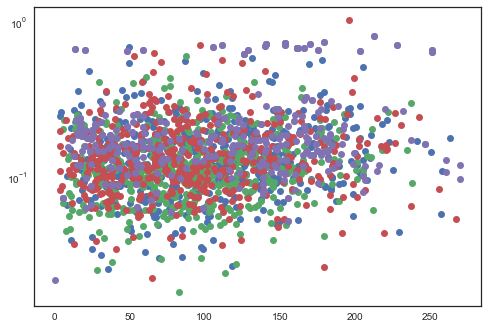

In [262]:
plt.plot(g, w, 'o')
plt.plot(grc, wrc,'o')
plt.plot(gpc, wpc,'o')
plt.plot(gd_ant, wd_ant,'o')
plt.yscale('log')

In [265]:
st.describe(np.array(w)/(0.001 * np.array(g)+1.e-20))

DescribeResult(nobs=479, minmax=(0.1958127703844152, 69.61654057938283), mean=2.4733961015158896, variance=25.610579925954504, skewness=9.494939347285387, kurtosis=112.59109474754473)

In [264]:
st.describe(np.array(wrc)/(0.001 * np.array(grc)+1.e-20))

DescribeResult(nobs=487, minmax=(0.21358427791291454, 39.099557653973605), mean=2.2503591043994513, variance=10.699106837890929, skewness=6.497032426919119, kurtosis=59.79270942710132)

In [263]:
st.describe(np.array(wpc)/(0.001 * np.array(gpc)+1.e-20))

DescribeResult(nobs=487, minmax=(0.1481937096496477, 52.700989962796235), mean=2.817393319001909, variance=20.25726483375345, skewness=6.758573919985096, kurtosis=58.98363720091887)

In [266]:
grf,wrf,urf = nal.distance_compare(transnet.data_net, transnet.school_data, np.array(transnet.school_data.query('Denomination == "Reformatorisch"').BRIN),weight='inv_weight', sample=500)

selecting pairs


In [267]:
gan,wan,uan = nal.distance_compare(transnet.data_net, transnet.school_data, np.array(transnet.school_data.query('Denomination == "Antroposofisch"').BRIN),weight='inv_weight', sample=500)

selecting pairs


In [268]:
st.describe(np.array(wan)/(0.001 * np.array(gan)+1.e-20))

DescribeResult(nobs=500, minmax=(0.4116093517021868, 1.9230769230769234e+18), mean=3846153846153847.0, variance=7.39644970414175e+33, skewness=22.293541755586087, kurtosis=495.0020040080397)

In [269]:
st.describe(np.array(wrf)/(0.001 * np.array(grf)+1.e-20))

DescribeResult(nobs=500, minmax=(0.05757086729440192, 87.96640916319494), mean=1.253323728635973, variance=18.596894524952898, skewness=16.72522320239096, kurtosis=326.7166424018651)

In [85]:
school_count = transnet.school_data.groupby('Denomination').count()[['BRIN']].sort_values('BRIN', ascending=False).reset_index().rename(columns = {'BRIN':'Schools'})

In [86]:
school_count['mix'] = ['Samen' not in n for n in school_count.Denomination]

In [87]:
pri_count = transnet.school_data.query('kind=="pri"').groupby('Denomination').count()[['BRIN']].sort_values('BRIN', ascending=False).reset_index().rename(columns = {'BRIN':'Primary'})

In [88]:
sec_count = transnet.school_data.query('kind=="sec"').groupby('Denomination').count()[['BRIN']].sort_values('BRIN', ascending=False).reset_index().rename(columns = {'BRIN':'Secondary'})

In [89]:
school_count = school_count.merge(pri_count, on='Denomination', how='outer' )
school_count = school_count.merge(sec_count, on='Denomination', how='outer' )

In [90]:
school_count = school_count.sort_values(['mix', 'Schools'], ascending=False).fillna(0).drop('mix', axis=1)

In [91]:
school_count


,Denomination,Schools,Primary,Secondary
0,Openbaar,2810,2466.0,344.0
1,Rooms-Katholiek,2554,2258.0,296.0
2,Protestants-Christelijk,2147,1904.0,243.0
3,Algemeen bijzonder,807,579.0,228.0
4,Reformatorisch,208,181.0,27.0
6,Gereformeerd vrijgemaakt,118,118.0,0.0
7,Antroposofisch,81,70.0,11.0
8,Islamitisch,44,43.0,1.0
10,Interconfessioneel,21,15.0,6.0
11,Gereformeerd,18,0.0,18.0


In [92]:

school_count[['Primary', 'Secondary']] = school_count[['Primary', 'Secondary']].astype(int)


In [93]:
school_count

,Denomination,Schools,Primary,Secondary
0,Openbaar,2810,2466,344
1,Rooms-Katholiek,2554,2258,296
2,Protestants-Christelijk,2147,1904,243
3,Algemeen bijzonder,807,579,228
4,Reformatorisch,208,181,27
6,Gereformeerd vrijgemaakt,118,118,0
7,Antroposofisch,81,70,11
8,Islamitisch,44,43,1
10,Interconfessioneel,21,15,6
11,Gereformeerd,18,0,18


In [94]:
import community

In [41]:
partition = community.best_partition(transnet.data_net, weight='weight')

In [42]:
partition_frame = pd.DataFrame.from_dict(partition, orient='index').reset_index()

In [43]:
partition_frame.columns = ['BRIN', 'Part']

In [44]:
school_data_parts = transnet.school_data.merge(partition_frame, on='BRIN', how='inner')

In [45]:
school_data_parts.Part.unique()

array([ 6, 10,  9,  0,  1,  7,  3,  2, 11,  4,  8,  5])

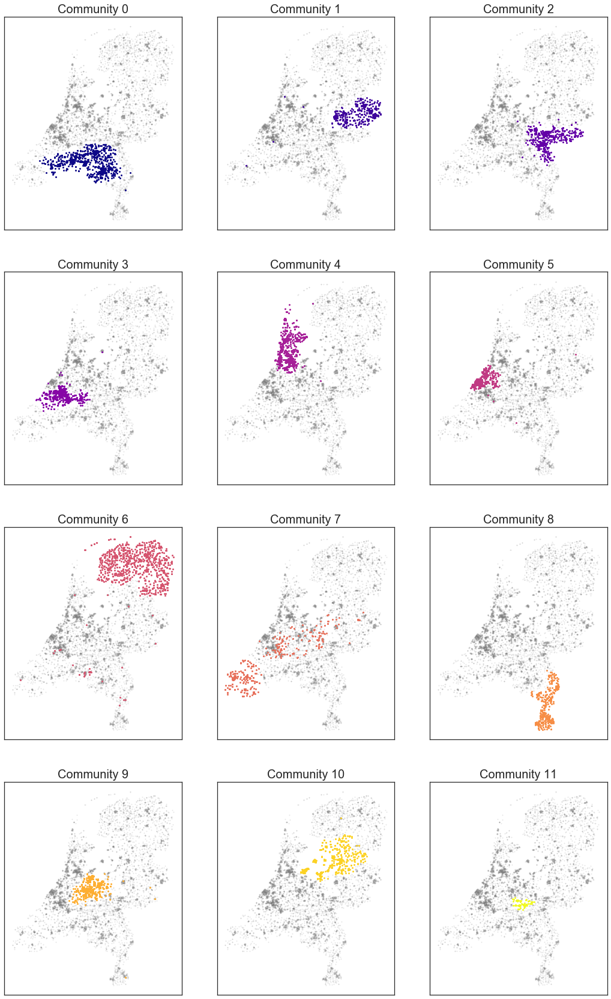

In [46]:
NUM_COLORS = 12
cm = plt.get_cmap('plasma')
colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
fig = plt.figure(figsize=[18,30])
for part in range(12):
    
    ax=fig.add_subplot(4,3,part+1)
    pd.DataFrame(school_data_parts).query('Part != @part').plot(x='x_coord', y='y_coord', style='o',ms=2, mfc='Grey', ax=ax, alpha=0.2)
    pd.DataFrame(school_data_parts).query('Part == @part').plot(x='x_coord', y='y_coord', style='o',ms=3, mfc=cm(part/11.), ax=ax, alpha=1.)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_title('Community ' + str(part), fontsize=20)
    ax.legend([])
    


In [361]:
 pd.DataFrame(school_data_parts).columns

Index([u'BRIN', u'pc6', u'provincie', u'Denomination', u'x_coord', u'y_coord',
       u'kind', u'geometry', u'xy', u'pc2', u'Part'],
      dtype='object')

In [437]:
school_data_parts.query('Denomination == "Reformatorisch"').groupby('Part').count().BRIN

Part
0       2
2       1
4       1
5       6
6       2
7     166
10     30
Name: BRIN, dtype: int64

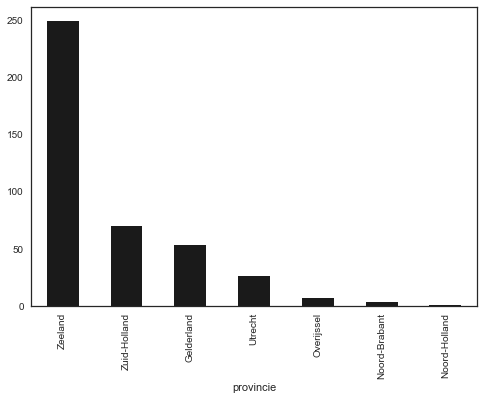

In [47]:
ax = school_data_parts.query('Part == 7.').groupby('provincie').count().BRIN.sort_values(ascending=False).plot('bar', color='k')


Denomination
Reformatorisch                    130
Protestants-Christelijk            28
Protestants Christelijk/Reform      1
Gereformeerd vrijgemaakt            1
Name: BRIN, dtype: int64

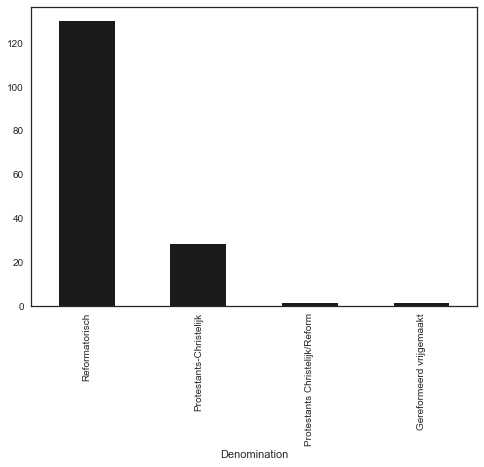

In [48]:
ax = school_data_parts.query('Part == 7. and provincie != "Zeeland"').groupby('Denomination').count().BRIN.sort_values(ascending= False).plot('bar', color='k')
school_data_parts.query('Part == 7. and provincie != "Zeeland"').groupby('Denomination').count().BRIN.sort_values(ascending= False)

In [489]:
school_data_parts.query('Denomination == "Reformatorisch"').groupby('Part').count().BRIN.sort_values(ascending= False)

Part
7     166
10     30
5       6
6       2
0       2
4       1
2       1
Name: BRIN, dtype: int64

In [490]:
166./208

0.7980769230769231

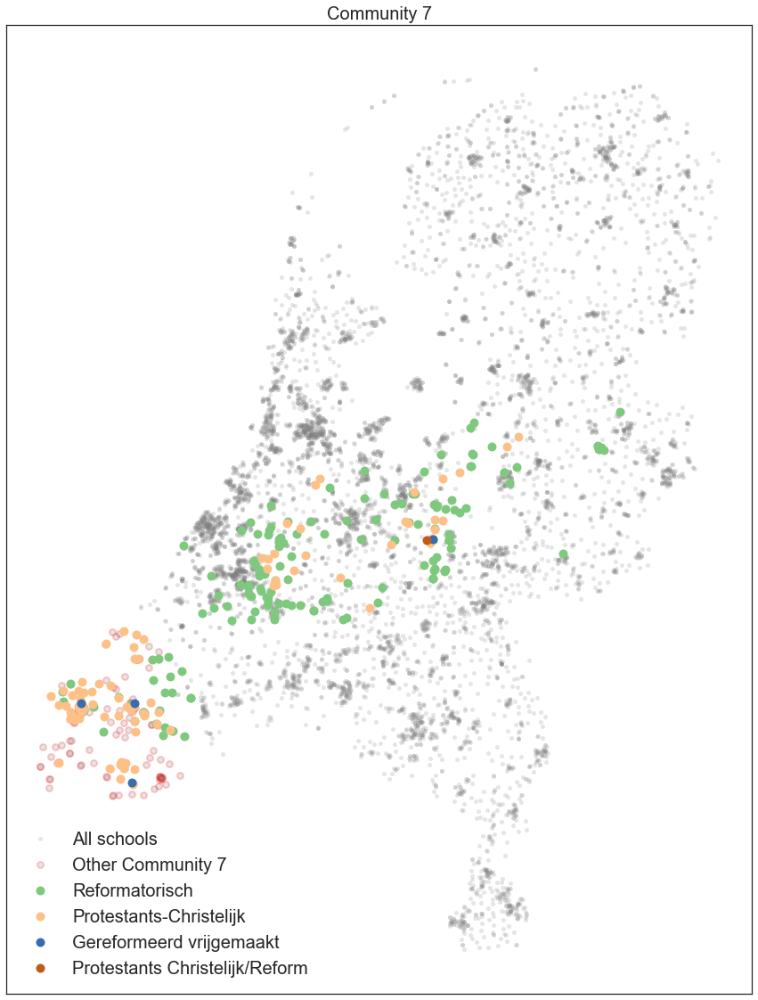

In [477]:
NUM_COLORS = 4
cm = plt.get_cmap('Accent')
colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
fig = plt.figure(figsize=[15,20])
ax=fig.add_subplot(111)
pd.DataFrame(school_data_parts).query('Part != 7').plot(x='x_coord', y='y_coord', style='o',ms=5, mfc='Grey', ax=ax, alpha=0.2)
pd.DataFrame(school_data_parts).query('Part == 7 and provincie == "Zeeland"').plot(x='x_coord', y='y_coord', style='o',ms=7, mfc='Grey', mec='red', mew=2., ax=ax, alpha=0.2)

for i, Den in enumerate(school_data_parts.query('Part == 7. and provincie != "Zeeland"').Denomination.unique()):
    pd.DataFrame(school_data_parts).query('Part == 7 and Denomination == @Den').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc=cm(i/4.), ax=ax, alpha=1.)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_title('Community 7', fontsize=20)
    ax.legend(['All schools', 'Other Community 7'] + list(school_data_parts.query('Part == 7. and provincie != "Zeeland"').Denomination.unique()), fontsize=20)

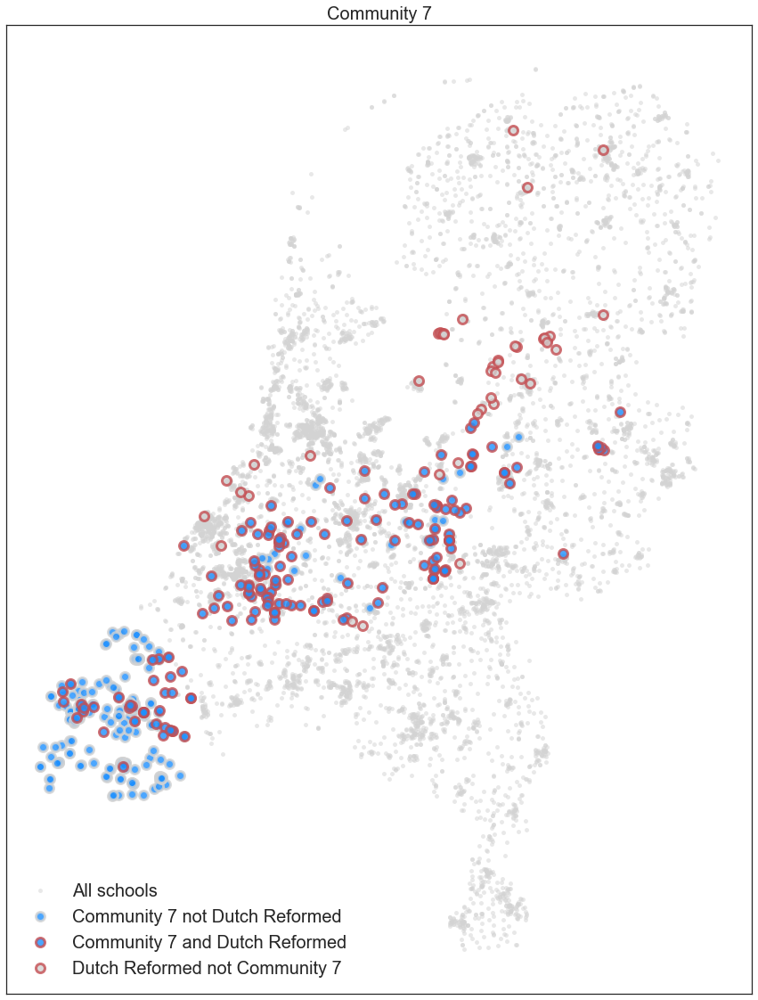

In [49]:
NUM_COLORS = 4
cm = plt.get_cmap('Accent')
colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
fig = plt.figure(figsize=[15,20])
ax=fig.add_subplot(111)


pd.DataFrame(school_data_parts).query('Part != 7 and Denomination != "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=5, mfc='LightGrey', ax=ax, alpha=0.5)
pd.DataFrame(school_data_parts).query('Part == 7 and Denomination != "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='DodgerBlue', mec='LightGrey', mew=3., ax=ax, alpha=0.8)
pd.DataFrame(school_data_parts).query('Part == 7 and Denomination == "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='DodgerBlue', mec='r', mew=3., ax=ax, alpha=0.8)
pd.DataFrame(school_data_parts).query('Part != 7 and Denomination == "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='LightGrey', mec='r', mew=3., ax=ax, alpha=0.8)




ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_title('Community 7', fontsize=20)
ax.legend(['All schools', 'Community 7 not Dutch Reformed','Community 7 and Dutch Reformed','Dutch Reformed not Community 7' ], fontsize=20)

NameError: name 'school_data_parts' is not defined

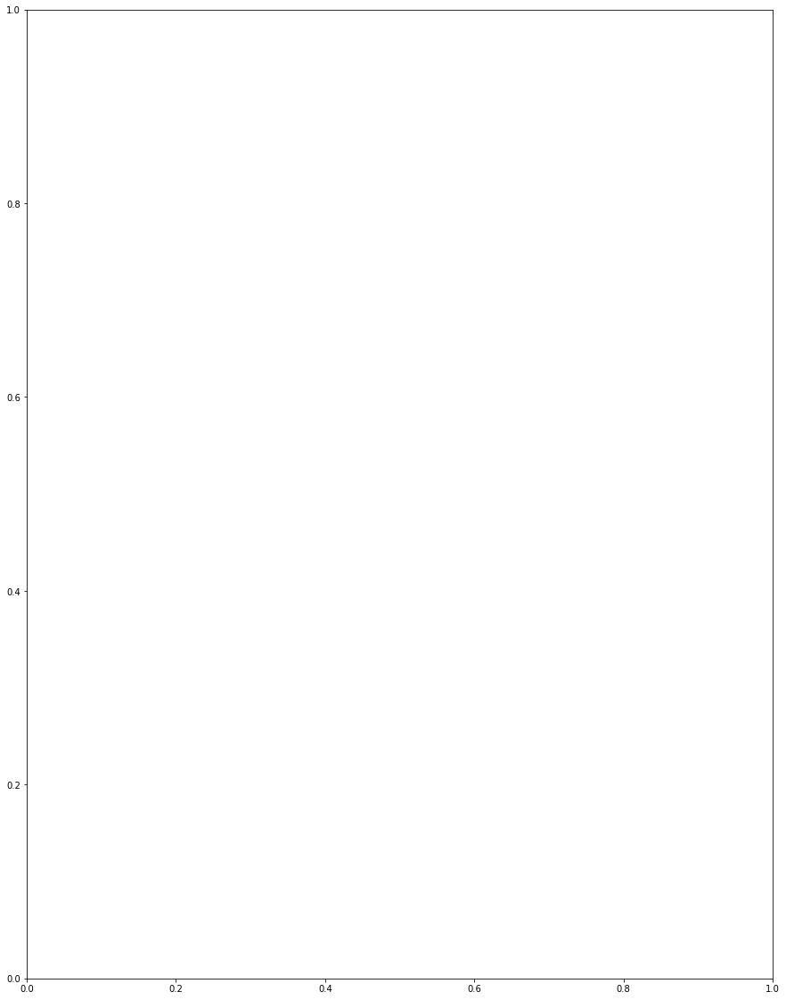

In [235]:
NUM_COLORS = 4
cm = plt.get_cmap('Accent')
colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
fig = plt.figure(figsize=[15,20])
ax=fig.add_subplot(111)


pd.DataFrame(school_data_parts).query('Denomination != "Reformatorisch" and Denomination != "Antroposophisch" ').plot(x='x_coord', y='y_coord', style='o',ms=5, mfc='LightGrey', ax=ax, alpha=0.5)
pd.DataFrame(school_data_parts).query('Part == 7 and Denomination != "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='DodgerBlue', mec='LightGrey', mew=3., ax=ax, alpha=0.8)
pd.DataFrame(school_data_parts).query('Part == 7 and Denomination == "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='DodgerBlue', mec='r', mew=3., ax=ax, alpha=0.8)
pd.DataFrame(school_data_parts).query('Part != 7 and Denomination == "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='LightGrey', mec='r', mew=3., ax=ax, alpha=0.8)




ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_title('Community 7', fontsize=20)
ax.legend(['All schools', 'Community 7 not Dutch Reformed','Community 7 and Dutch Reformed','Dutch Reformed not Community 7' ], fontsize=20)

In [473]:
school_data_parts.query('Part == 7.').groupby('provincie').count().BRIN

provincie
Gelderland        53
Noord-Brabant      3
Noord-Holland      1
Overijssel         7
Utrecht           26
Zeeland          249
Zuid-Holland      70
Name: BRIN, dtype: int64

In [479]:
school_data_parts.query('provincie == "Zeeland"').groupby('Part').count().BRIN

Part
0     17
1      1
3      1
6      1
7    249
Name: BRIN, dtype: int64

In [427]:
[b in so_frame.vestigingsnummer for b in  school_data_parts.query('Part == 6. and y_coord<500000').BRIN]

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False]

In [483]:
249/(249. + 20.)

0.9256505576208178

In [533]:
partition_frame_single = partition_frame.copy()

In [534]:
partition_frame_single['Part'] = 0.

In [549]:
community.modularity(partition,transnet.data_net, weight=)

0.697340920628956

In [567]:
partitions = community.generate_dendrogram(transnet.data_net, weight='weight')

In [545]:
community.generate_dendrogram()

In [566]:
community.generate_dendrogram?

In [590]:
G=transnet.data_net
dendo = community.generate_dendrogram(G, weight='weight', randomize=True)
for level in range(len(dendo) - 1) :
       print("partition at level", level,"is")

('partition at level', 0, 'is')
('partition at level', 1, 'is')


In [595]:
parts = []
mods = []
for x in xrange(5):
    parts.append(community.best_partition(transnet.data_net, weight='weight', randomize=True))
    mods.append(community.modularity(parts[-1], transnet.data_net, weight='weight'))

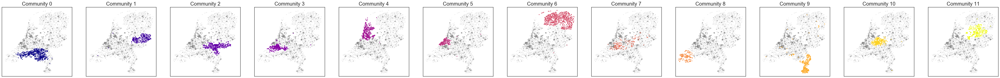

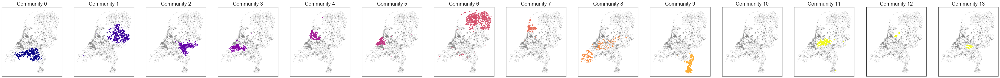

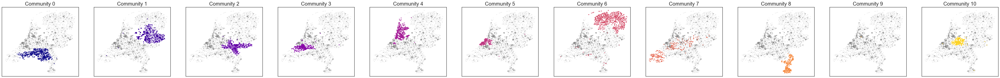

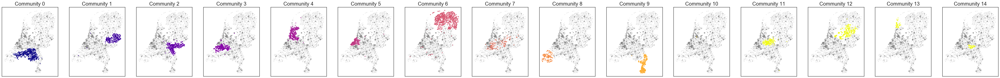

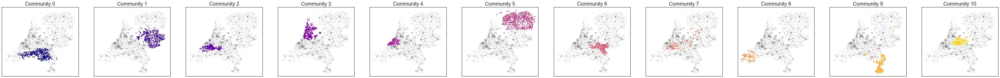

In [603]:
for partition_ in parts:
    part_frame = pd.DataFrame.from_dict(partition_, orient='index').reset_index()
    part_frame.columns = ['BRIN', 'Part']
    school_data_p = transnet.school_data.merge(part_frame, on='BRIN', how='inner')
    NUM_COLORS = len(school_data_p.Part.unique())
    cm = plt.get_cmap('plasma')
    colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
    fig = plt.figure(figsize=[70,5])
    for part in range(NUM_COLORS):

        ax=fig.add_subplot(1,NUM_COLORS,part+1)
        pd.DataFrame(school_data_p).query('Part != @part').plot(x='x_coord', y='y_coord', style='o',ms=2, mfc='Grey', ax=ax, alpha=0.2)
        pd.DataFrame(school_data_p).query('Part == @part').plot(x='x_coord', y='y_coord', style='o',ms=3, mfc=cm(part/11.), ax=ax, alpha=1.)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_title('Community ' + str(part), fontsize=20)
        ax.legend([])


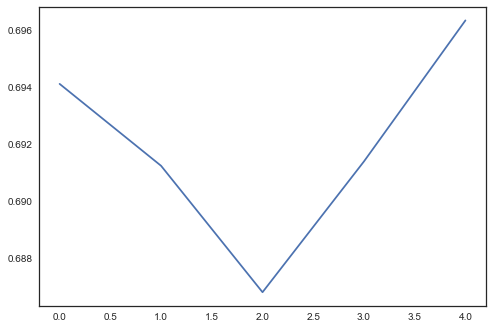

In [604]:
plt.plot(mods)

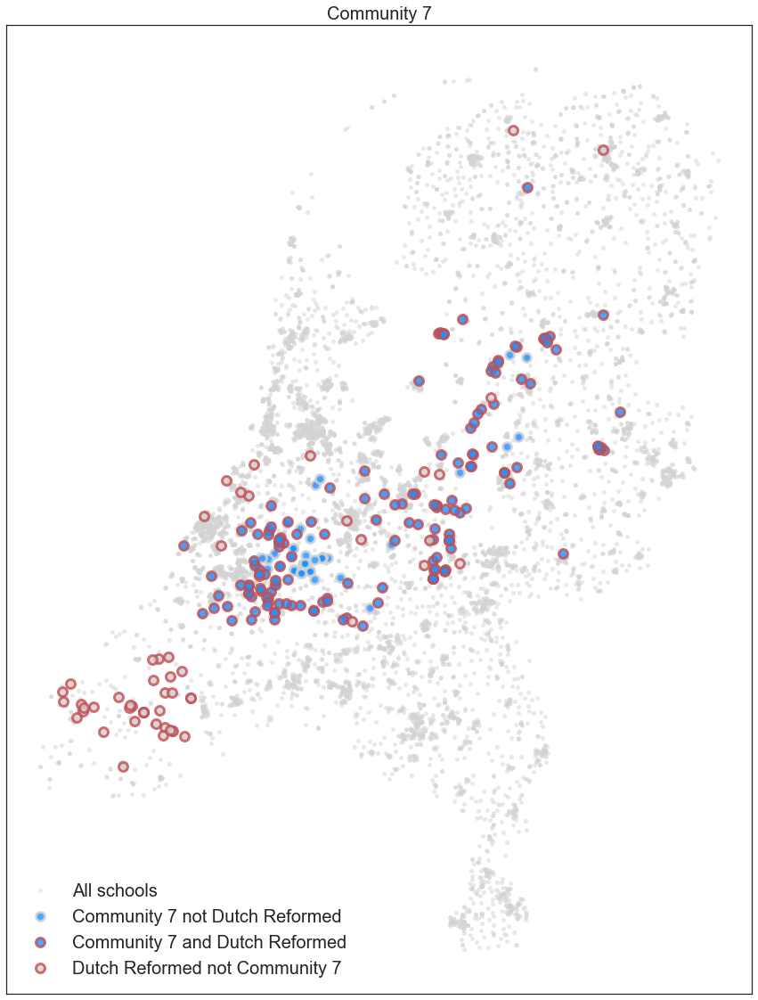

In [605]:
for partition_ in parts:
    part_frame = pd.DataFrame.from_dict(partition_, orient='index').reset_index()
    part_frame.columns = ['BRIN', 'Part']
    school_data_p = transnet.school_data.merge(part_frame, on='BRIN', how='inner')
    
    NUM_COLORS = 4
    cm = plt.get_cmap('Accent')
    colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
    fig = plt.figure(figsize=[15,20])
    ax=fig.add_subplot(111)


    pd.DataFrame(school_data_p).query('Part != 7 and Denomination != "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=5, mfc='LightGrey', ax=ax, alpha=0.5)
    pd.DataFrame(school_data_p).query('Part == 7 and Denomination != "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='DodgerBlue', mec='LightGrey', mew=3., ax=ax, alpha=0.8)
    pd.DataFrame(school_data_p).query('Part == 7 and Denomination == "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='DodgerBlue', mec='r', mew=3., ax=ax, alpha=0.8)
    pd.DataFrame(school_data_p).query('Part != 7 and Denomination == "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='LightGrey', mec='r', mew=3., ax=ax, alpha=0.8)




    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_title('Community 7', fontsize=20)
    ax.legend(['All schools', 'Community 7 not Dutch Reformed','Community 7 and Dutch Reformed','Dutch Reformed not Community 7' ], fontsize=20)

In [611]:
school_data_p.query('Denomination == "Reformatorisch"').groupby('Part').count().BRIN.sort_values(ascending= False).reset_index()

,Part,BRIN
0,7,154
1,8,36
2,4,6
3,10,3
4,6,3
5,5,2
6,1,2
7,3,1
8,0,1


In [56]:
school_data_parts['community'] = school_data_parts.Part == 7.
school_data_parts['community'] = school_data_parts['community']*1

In [57]:
from sklearn.linear_model import LogisticRegression
from patsy import dmatrices

In [92]:
y, X = dmatrices('community ~ Denomination + provincie', 
                  school_data_parts, return_type="dataframe")
print X.columns

Index([u'Intercept', u'Denomination[T.Antroposofisch]',
       u'Denomination[T.Evangelisch]',
       u'Denomination[T.Evangelische broedergemeenscha]',
       u'Denomination[T.Gereformeerd]',
       u'Denomination[T.Gereformeerd vrijgemaakt]',
       u'Denomination[T.Hindoe�stisch]', u'Denomination[T.Interconfessioneel]',
       u'Denomination[T.Islamitisch]', u'Denomination[T.Joods]',
       u'Denomination[T.Joods orthodox]', u'Denomination[T.Openbaar]',
       u'Denomination[T.Overige]',
       u'Denomination[T.Protestants Christelijk/Reform]',
       u'Denomination[T.Protestants-Christelijk]',
       u'Denomination[T.Protestants-Christelijk/Evange]',
       u'Denomination[T.Reformatorisch]', u'Denomination[T.Rooms-Katholiek]',
       u'Denomination[T.Samenwerking Opb., Alg. Bijz.]',
       u'Denomination[T.Samenwerking Opb., PC]',
       u'Denomination[T.Samenwerking Opb., PC, RK]',
       u'Denomination[T.Samenwerking Opb., PC, RK, Alg]',
       u'Denomination[T.Samenwerking Opb.,

In [105]:
school_data_parts.columns

NameError: name 'school_data_parts' is not defined

In [104]:
X

,Intercept,Denomination[T.Antroposofisch],Denomination[T.Evangelisch],Denomination[T.Evangelische broedergemeenscha],Denomination[T.Gereformeerd],Denomination[T.Gereformeerd vrijgemaakt],Denomination[T.Hindoe�stisch],Denomination[T.Interconfessioneel],Denomination[T.Islamitisch],Denomination[T.Joods],...,provincie[T.Friesland],provincie[T.Gelderland],provincie[T.Groningen],provincie[T.Limburg],provincie[T.Noord-Brabant],provincie[T.Noord-Holland],provincie[T.Overijssel],provincie[T.Utrecht],provincie[T.Zeeland],provincie[T.Zuid-Holland]
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
y = np.ravel(y)

In [62]:
model = LogisticRegression()
model = model.fit(X, y)

# check the accuracy on the training set
model.score(X, y)

0.9917096123683621

In [63]:
y.mean()


0.04582119650459332

In [64]:
pd.DataFrame(zip(X.columns, np.transpose(model.coef_)))

,0,1
0,Intercept,[-2.4648504829779814]
1,Denomination[T.Antroposofisch],[-0.33202009294513074]
2,Denomination[T.Evangelisch],[-0.11009871066576757]
3,Denomination[T.Evangelische broedergemeenscha],[-0.013584509310537255]
4,Denomination[T.Gereformeerd],[-0.11604649368877035]
5,Denomination[T.Gereformeerd vrijgemaakt],[0.24817464501178785]
6,Denomination[T.Hindoe�stisch],[-0.0552146898403671]
7,Denomination[T.Interconfessioneel],[-0.11533156186446836]
8,Denomination[T.Islamitisch],[-0.2464779243374356]
9,Denomination[T.Joods],[-0.0036233488829524]


In [97]:
import statsmodels.api as sm

In [98]:
logit = sm.Logit(y, np.array(X)[:,1:],)


In [99]:
result = logit.fit(method='bfgs')

         Current function value: 0.048627
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


In [106]:
X

,Intercept,Denomination[T.Antroposofisch],Denomination[T.Evangelisch],Denomination[T.Evangelische broedergemeenscha],Denomination[T.Gereformeerd],Denomination[T.Gereformeerd vrijgemaakt],Denomination[T.Hindoe�stisch],Denomination[T.Interconfessioneel],Denomination[T.Islamitisch],Denomination[T.Joods],...,provincie[T.Friesland],provincie[T.Gelderland],provincie[T.Groningen],provincie[T.Limburg],provincie[T.Noord-Brabant],provincie[T.Noord-Holland],provincie[T.Overijssel],provincie[T.Utrecht],provincie[T.Zeeland],provincie[T.Zuid-Holland]
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [100]:
s = result.summary2()

In [101]:
s.tables[1].rename(columns ={'P>|z|' : 'p_val', 'Coef.':'coef'}, inplace=True)
s.tables[1].set_index(X.columns[1:], inplace=True)

In [110]:
s.tables

[                     0                 1                  2          3
 0               Model:             Logit  Pseudo R-squared:      0.881
 1  Dependent Variable:         community               AIC:   942.0846
 2                Date:  2019-06-19 13:01               BIC:  1204.6633
 3    No. Observations:              8926    Log-Likelihood:    -434.04
 4            Df Model:                36           LL-Null:    -3656.9
 5        Df Residuals:              8889       LLR p-value:     0.0000
 6           Converged:            0.0000             Scale:     1.0000,
                                                     coef   Std.Err.  \
 Denomination[T.Antroposofisch]                 -0.430958   0.938955   
 Denomination[T.Evangelisch]                    -0.039716   1.677285   
 Denomination[T.Evangelische broedergemeenscha] -0.011735  11.614359   
 Denomination[T.Gereformeerd]                   -0.023291   1.342915   
 Denomination[T.Gereformeerd vrijgemaakt]       -0.111927   0.6

In [95]:
parts = []
mods = []

print 'Detecting communities'
for x in xrange(20):
    print '\t Detecting communities, round: ' , x
    parts.append(community.best_partition(transnet.data_net, weight='weight', randomize=True))
    mods.append(community.modularity(parts[-1], transnet.data_net, weight='weight'))
    
print 'Step 1 complete: communities detected'

log_outs=[]
community_no = []

coefs = []
p_s = []
ref_parts = []
for partition_ in parts:
    part_frame = pd.DataFrame.from_dict(partition_, orient='index').reset_index()
    part_frame.columns = ['BRIN', 'Part']
    school_data_p = transnet.school_data.merge(part_frame, on='BRIN', how='inner')

    print 'Step 2: communities detected'

    for com in school_data_p.Part.unique():
        school_data_p['community'] = school_data_p.Part == com
        school_data_p['community'] = school_data_p['community']*1
        y, X = dmatrices('community ~ Denomination + provincie', 
                      school_data_p, return_type="dataframe")

        logit = sm.Logit(y, np.array(X)[:,1:],)
        result = logit.fit(method='bfgs')
        s = result.summary2()
        s.tables[1].rename(columns ={'P>|z|' : 'p_val', 'Coef.':'coef'}, inplace=True)
        s.tables[1].set_index(X.columns[1:], inplace=True)

        pos_cor = s.tables[1].query('p_val < 0.01 and coef > 0')

        if 'Denomination[T.Reformatorisch]' in pos_cor.index:
            log_outs.append(list(pos_cor[pos_cor.index =='Denomination[T.Reformatorisch]'][['coef', 
                                                                                            'p_val']].values[0]))
            community_no.append(com)
    
    

Detecting communities
	 Detecting communities, round:  0
	 Detecting communities, round:  1
	 Detecting communities, round:  2
	 Detecting communities, round:  3
	 Detecting communities, round:  4
	 Detecting communities, round:  5
	 Detecting communities, round:  6
	 Detecting communities, round:  7
	 Detecting communities, round:  8
	 Detecting communities, round:  9
	 Detecting communities, round:  10
	 Detecting communities, round:  11
	 Detecting communities, round:  12
	 Detecting communities, round:  13
	 Detecting communities, round:  14
	 Detecting communities, round:  15
	 Detecting communities, round:  16
	 Detecting communities, round:  17
	 Detecting communities, round:  18
	 Detecting communities, round:  19
Step 1 complete: communities detected
Step 2: communities detected


NameError: name 'sm' is not defined

In [12]:
import pickle
pickle.dump(parts, open( "parts.p", "wb" ) )
pickle.dump(mods, open( "mods.p", "wb" ) )

In [ ]:
no_reformed = []
no_community = []
BRINs = []
for i, com in enumerate(community_no):
    
    part_frame = pd.DataFrame.from_dict(parts[i], orient='index').reset_index()
    part_frame.columns = ['BRIN', 'Part']
    school_data_p = transnet.school_data.merge(part_frame, on='BRIN', how='inner')
    no_reformed.append(1.*len(school_data_p.query('Part == @com and Denomination == "Reformatorisch"')))
    no_community.append(1.*len(school_data_p.query('Part == @com')))
    BRINs.append(list(school_data_p.query('Part == @com').BRIN))

([<matplotlib.axis.XTick at 0x13cb28810>,
 <a list of 2 Text xticklabel objects>)

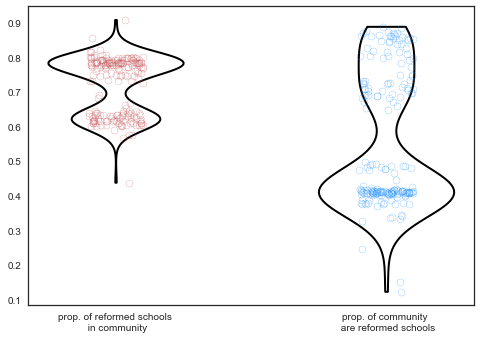

In [166]:
bits = plt.violinplot([np.array(no_reformed)/208., np.array(no_reformed)/np.array(no_community)], widths=0.5,showextrema=False)



randomx_r = np.random.random(len(no_reformed))
plt.plot(0.9 + randomx_r*0.2, np.array(no_reformed)/208., 'o', mec='r', mew=0.2, mfc='none')
plt.plot(1.9 + randomx_r*0.2, np.array(no_reformed)/np.array(no_community), 'o', mec='DodgerBlue', mew=0.2, mfc='none')

for pc in bits['bodies']:
    pc.set_facecolor('none')
    pc.set_edgecolor('black')
    pc.set_linewidth(2.)
    pc.set_alpha(1)
    
plt.xticks([1,2], ['prop. of reformed schools \n in community', 'prop. of community \n are reformed schools'])

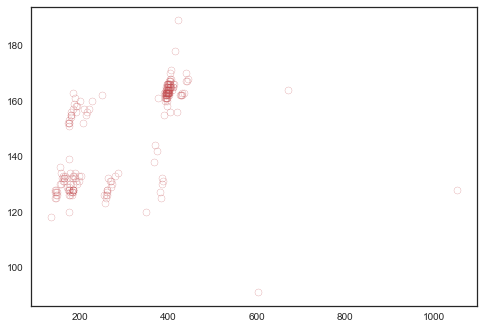

In [167]:
plt.plot(np.array(no_community), np.array(no_reformed), 'o', mec='r', mew=0.2, mfc='none')


([<matplotlib.axis.XTick at 0x1466c9f90>],
 <a list of 1 Text xticklabel objects>)

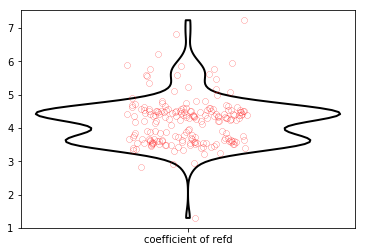

In [133]:
bits = plt.violinplot(np.array(log_outs)[:,0], widths=0.5,showextrema=False)



randomx_r = np.random.random(200)
plt.plot(0.9 + randomx_r*0.2, np.array(np.array(log_outs)[:,0]), 'o', mec='r', mew=0.2, mfc='none')

for pc in bits['bodies']:
    pc.set_facecolor('none')
    pc.set_edgecolor('black')
    pc.set_linewidth(2.)
    pc.set_alpha(1)
    
plt.xticks([1], ['coefficient of refd'])



In [13]:
coms = []

for i, com in enumerate(parts):
    
    part_frame = pd.DataFrame.from_dict(parts[i], orient='index').reset_index()
    part_frame.columns = ['BRIN', 'Part']
    school_data_p = transnet.school_data.merge(part_frame, on='BRIN', how='inner')
    coms.append(list(school_data_p.sort_values(['provincie','xy']).Part))

In [20]:
summed_mats = np.zeros([len(coms[0]), len(coms[0])]) 

for i, com in enumerate(coms):
    print 'Set ', i 
    summed_mats = summed_mats + np.array([list(np.array(com) == com[n]) for n in xrange(len(com))])

Set  0
Set  1
Set  2
Set  3
Set  4
Set  5
Set  6
Set  7
Set  8
Set  9
Set  10
Set  11
Set  12
Set  13
Set  14
Set  15
Set  16
Set  17
Set  18
Set  19
Set  20
Set  21
Set  22
Set  23
Set  24
Set  25
Set  26
Set  27
Set  28
Set  29
Set  30
Set  31
Set  32
Set  33
Set  34
Set  35
Set  36
Set  37
Set  38
Set  39
Set  40
Set  41
Set  42
Set  43
Set  44
Set  45
Set  46
Set  47
Set  48
Set  49
Set  50
Set  51
Set  52
Set  53
Set  54
Set  55
Set  56
Set  57
Set  58
Set  59
Set  60
Set  61
Set  62
Set  63
Set  64
Set  65
Set  66
Set  67
Set  68
Set  69
Set  70
Set  71
Set  72
Set  73
Set  74
Set  75
Set  76
Set  77
Set  78
Set  79
Set  80
Set  81
Set  82
Set  83
Set  84
Set  85
Set  86
Set  87
Set  88
Set  89
Set  90
Set  91
Set  92
Set  93
Set  94
Set  95
Set  96
Set  97
Set  98
Set  99
Set  100
Set  101
Set  102
Set  103
Set  104
Set  105
Set  106
Set  107
Set  108
Set  109
Set  110
Set  111
Set  112
Set  113
Set  114
Set  115
Set  116
Set  117
Set  118
Set  119
Set  120
Set  121
Set  122
Set

In [21]:
sim_mat = summed_mats/200.

In [41]:
match_mats_np = map(np.array, match_mats)

In [44]:
sim_mat = np.array(match_mats_np).sum(axis=0)/30.

In [23]:
pickle.dump(sim_mat, open( "sim_mat.p", "wb" ) )

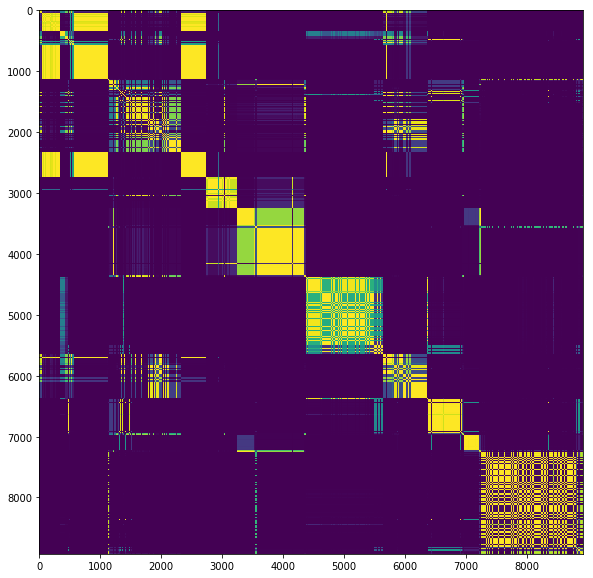

In [176]:
fig = plt.figure(figsize=[10,10])
plt.imshow(sim_mat,cmap='viridis')

In [46]:
nodelist_sm = np.array(school_data_p.sort_values(['provincie','xy']).BRIN)

In [34]:
clusters = []
for n, col in enumerate(sim_mat):
    certs = list(np.where(col>0.5)[0])
    if np.product([n not in clust for clust in clusters]) or len(clusters) == 0:
        clusters.append(certs)

In [35]:
clusters_BRIN = [nodelist_sm[clust] for clust in clusters]

In [36]:
transnet.school_data['clust'] = np.zeros(len(transnet.school_data))

NameError: name 'cm' is not defined

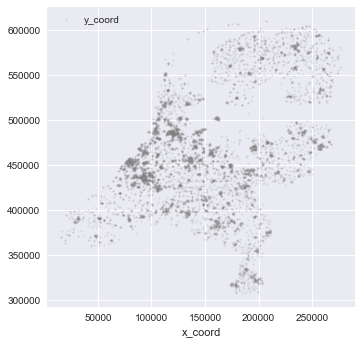

In [37]:
fig=plt.figure(figsize=[8*int(len(clusters_BRIN)**0.5), 8*int(len(clusters_BRIN)**0.5)])
for i, BRINS in enumerate(clusters_BRIN):

    ax=fig.add_subplot(int(len(clusters_BRIN)**0.5) + 1,int(len(clusters_BRIN)**0.5)+1,i+1)
    pd.DataFrame(school_data_p).query('BRIN not in @BRINS').plot(x='x_coord', y='y_coord', style='o',ms=2, mfc='Grey', ax=ax, alpha=0.2)
    pd.DataFrame(school_data_p).query('BRIN in @BRINS').plot(x='x_coord', y='y_coord', style='o',ms=3, mfc=cm(i/len(BRINsclust)), ax=ax, alpha=1.)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_title('Community ' + str(i), fontsize=20)
    ax.legend([])

In [180]:
def sim_mat_section(devtype='Denomination', devname='Reformatorisch', ax='new fig'):
    if ax == 'new fig':
        fig = plt.figure(figsize=[8,8], dpi=300)
        ax = fig.add_subplot(111)
    fers = np.where(school_data_p.sort_values(['provincie','xy'])[devtype] == devname)[0]
    submat = sim_mat[list(np.hstack(list(fers) * len(fers))), list(np.hstack(np.transpose([list(fers)] * len(fers))))]
    ax.imshow(np.reshape(submat, (len(fers), len(fers))), cmap='viridis')
    ax.grid()
    print 'mean pairwise probability ', devname, ': ' , np.mean(submat)

mean pairwise probability  Openbaar :  0.1253941121573314
mean pairwise probability  Algemeen bijzonder :  0.1157348649797728
mean pairwise probability  Antroposofisch :  0.11116293247980491
mean pairwise probability  Protestants-Christelijk :  0.12556191094885868
mean pairwise probability  Rooms-Katholiek :  0.14712421740921705
mean pairwise probability  Gereformeerd vrijgemaakt :  0.21441449338885235
mean pairwise probability  Reformatorisch :  0.5631927237426037
mean pairwise probability  Interconfessioneel :  0.2176417233560091
mean pairwise probability  Evangelisch :  0.150078125
mean pairwise probability  Hindoe�stisch :  0.2852
mean pairwise probability  Islamitisch :  0.14374483471074379
mean pairwise probability  Joods :  0.8125
mean pairwise probability  Evangelische broedergemeenscha :  0.5
mean pairwise probability  Gereformeerd :  0.27574074074074073
mean pairwise probability  Protestants-Christelijk/Evange :  1.0
mean pairwise probability  Protestants Christelijk/Reform :

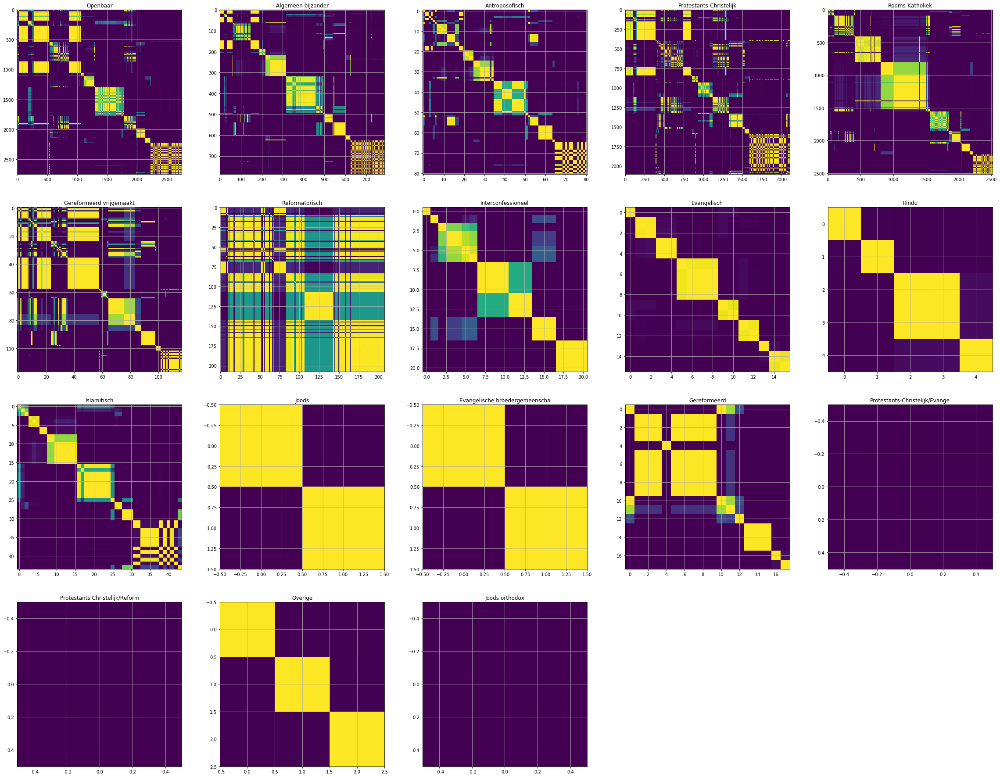

In [181]:
fig=plt.figure(figsize=[40,40])
for i, denominiation in enumerate(unique_denoms):
    ax = fig.add_subplot(5, 5, i +1)
    sim_mat_section('Denomination', denominiation, ax)
    try:
        ax.set_title(denominiation)
    except:
        ax.set_title('Hindu')

mean pairwise probability  Drenthe :  0.7446566481653054
mean pairwise probability  Flevoland :  0.5894091971656074
mean pairwise probability  Friesland :  0.9908304846938776
mean pairwise probability  Gelderland :  0.33586158483393297
mean pairwise probability  Groningen :  0.9982663426580968
mean pairwise probability  Limburg :  0.863139597268808
mean pairwise probability  Noord-Brabant :  0.7933340719217615
mean pairwise probability  Noord-Holland :  0.7526961078558673
mean pairwise probability  Overijssel :  0.5761320802830936
mean pairwise probability  Utrecht :  0.72410725843245
mean pairwise probability  Zeeland :  0.8802137891958376
mean pairwise probability  Zuid-Holland :  0.4483407277494331


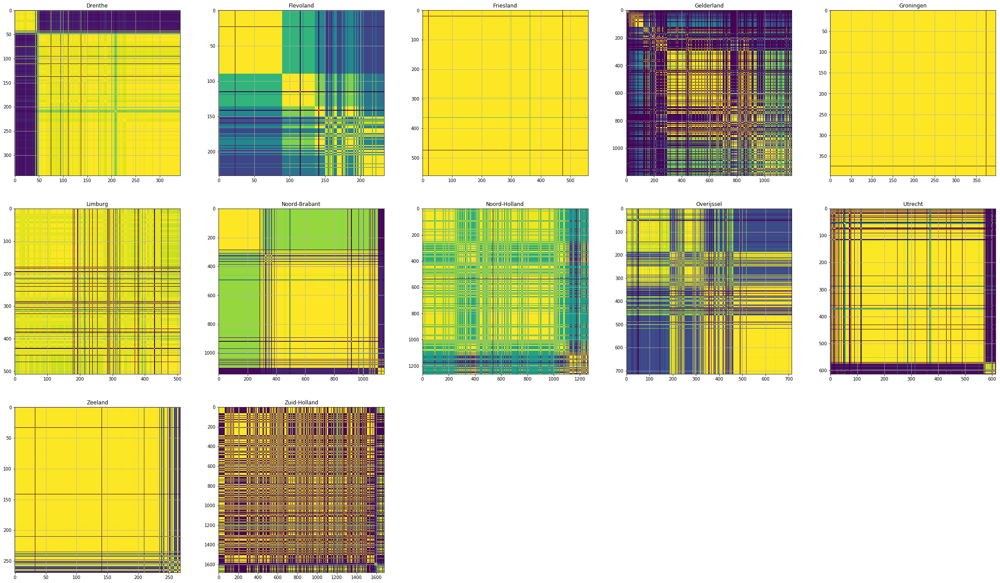

In [182]:
fig=plt.figure(figsize=[40,40])
for i, province in enumerate(school_data_p.provincie.unique()):
    ax = fig.add_subplot(5, 5, i +1)
    sim_mat_section('provincie', province, ax)
    try:
        ax.set_title(province)
    except:
        ax.set_title('Hindu')

In [25]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [26]:
Z = linkage(sim_mat, 'ward')

In [2]:
linkage

NameError: name 'linkage' is not defined

RuntimeError: maximum recursion depth exceeded while getting the str of an object

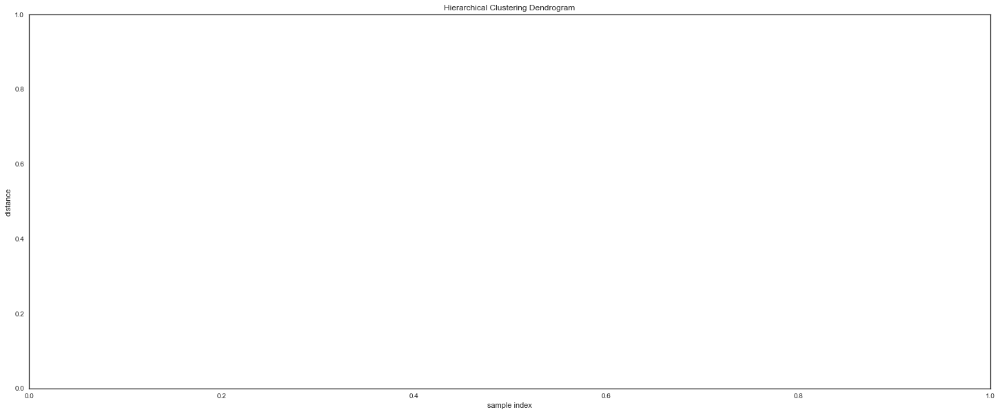

In [163]:
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

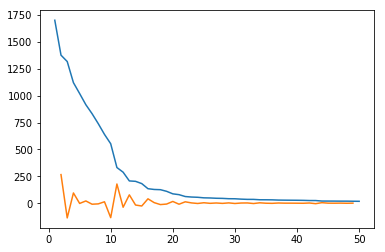

clusters: 2


In [175]:
last = Z[-50:, 2]
last_rev = last[::-1]
idxs = np.arange(1, len(last) + 1)
plt.plot(idxs, last_rev)

acceleration = np.diff(last, 2)  # 2nd derivative of the distances
acceleration_rev = acceleration[::-1]
plt.plot(idxs[:-2] + 1, acceleration_rev)
plt.show()
k = acceleration_rev.argmax() + 2  # if idx 0 is the max of this we want 2 clusters
print "clusters:", k

In [66]:
len(set(Z[:,-1]))

1232

In [31]:
from scipy.cluster.hierarchy import fcluster

In [46]:
k=12
clusters_hc = fcluster(Z, k, criterion='maxclust')

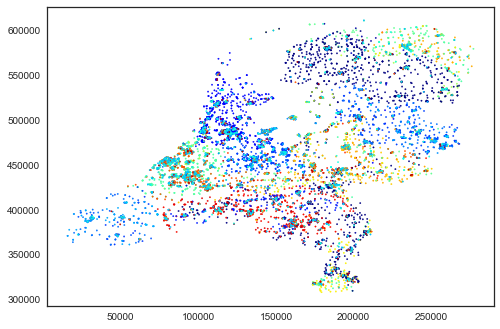

In [106]:
plt.scatter(school_data_p.x_coord, school_data_p.y_coord, c=clusters_hc, s=2, cmap='jet')

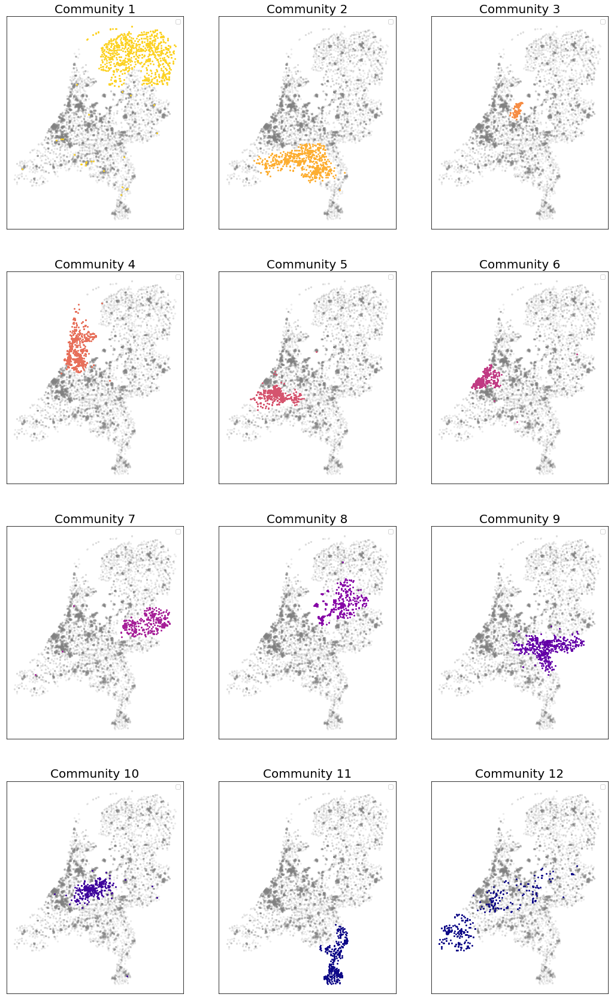

In [49]:
NUM_COLORS = 12
cm = plt.get_cmap('plasma_r')
colors = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
fig = plt.figure(figsize=[18,30])
for part in range(1,13):
    
    ax=fig.add_subplot(4,3,part)
    pd.DataFrame(school_data_p_sorted).query('hcc != @part').plot(x='x_coord', y='y_coord', style='o',ms=2, mec='Grey',mfc='none', ax=ax, alpha=0.2)
    pd.DataFrame(school_data_p_sorted).query('hcc == @part').plot(x='x_coord', y='y_coord', style='o',ms=3, mfc=cm(part/11.),mec='none', ax=ax, alpha=1.)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_title('Community ' + str(part), fontsize=20)
    ax.legend([])
    


In [47]:
school_data_p_sorted = school_data_p.sort_values(['provincie','xy'])

In [48]:
school_data_p_sorted['hcc'] = clusters_hc

In [36]:
school_data_p_sorted['hcc'].unique()

array([ 7,  1,  3,  9,  4, 11,  2,  8,  6, 10,  5])

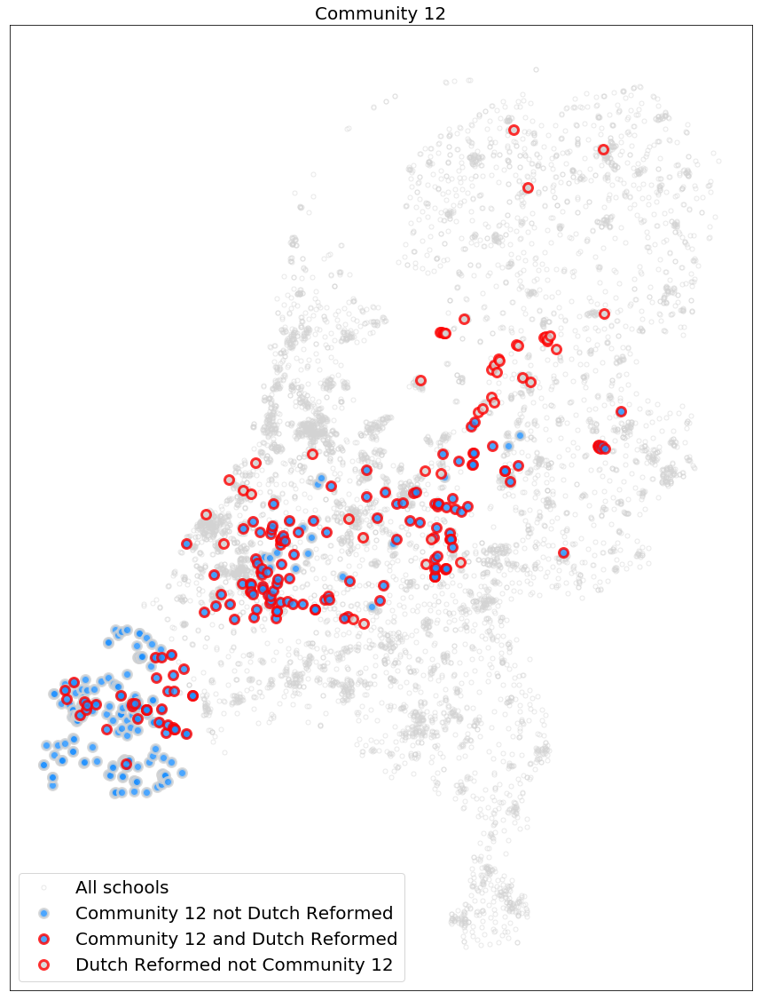

In [52]:

fig = plt.figure(figsize=[15,20])
ax=fig.add_subplot(111)


pd.DataFrame(school_data_p_sorted).query('hcc != 12 and Denomination != "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=5, mec='LightGrey', mfc='none', ax=ax, alpha=0.5)
pd.DataFrame(school_data_p_sorted).query('hcc == 12 and Denomination != "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='DodgerBlue', mec='LightGrey', mew=3., ax=ax, alpha=0.8)
pd.DataFrame(school_data_p_sorted).query('hcc == 12 and Denomination == "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='DodgerBlue', mec='r', mew=3., ax=ax, alpha=0.8)
pd.DataFrame(school_data_p_sorted).query('hcc != 12 and Denomination == "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='LightGrey', mec='r', mew=3., ax=ax, alpha=0.8)




ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_title('Community 12', fontsize=20)
ax.legend(['All schools', 'Community 12 not Dutch Reformed','Community 12 and Dutch Reformed','Dutch Reformed not Community 12' ], fontsize=20)

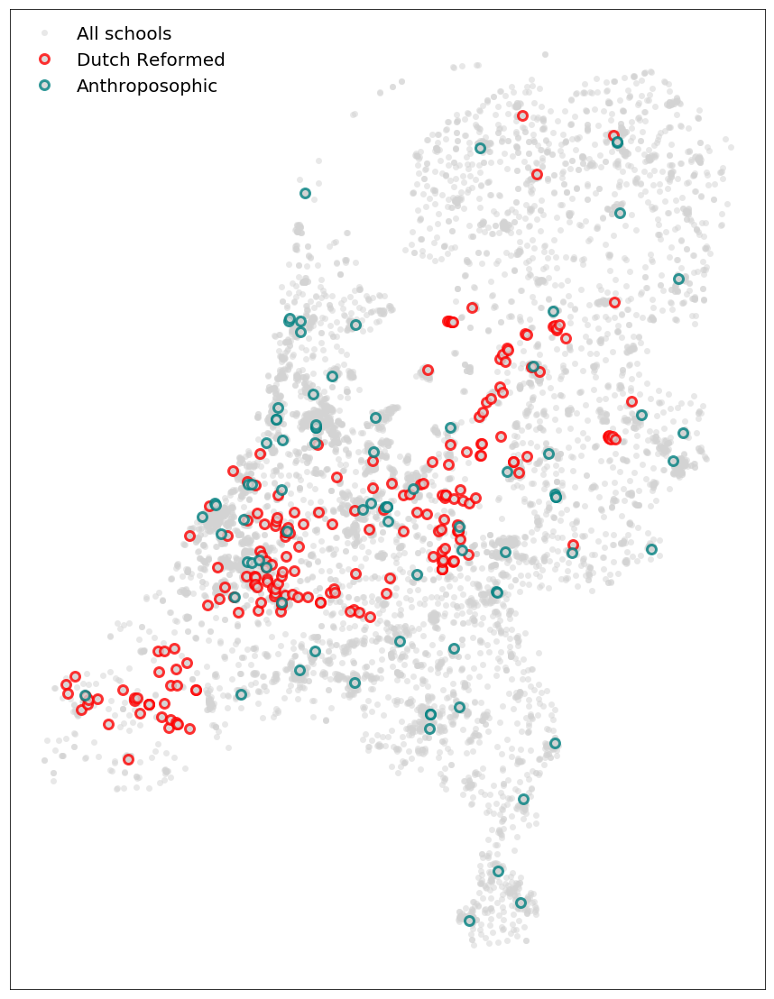

In [250]:

fig = plt.figure(figsize=[15,20])
ax=fig.add_subplot(111)


pd.DataFrame(school_data_p_sorted).query(' Denomination != "Reformatorisch" and Denomination != "Antroposofisch"').plot(x='x_coord', y='y_coord', style='o',ms=7, mfc='LightGrey', mec='none', ax=ax, alpha=0.5)
pd.DataFrame(school_data_p_sorted).query('Denomination == "Reformatorisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='LightGrey', mec='r', mew=3., ax=ax, alpha=0.8)
pd.DataFrame(school_data_p_sorted).query('Denomination == "Antroposofisch"').plot(x='x_coord', y='y_coord', style='o',ms=10, mfc='LightGrey', mec='Teal', mew=3., ax=ax, alpha=0.8)



ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')

ax.legend(['All schools', 'Dutch Reformed','Anthroposophic'], fontsize=20, frameon=False)

In [61]:
tables = []
for partition_ in parts:
    part_frame = pd.DataFrame.from_dict(partition_, orient='index').reset_index()
    part_frame.columns = ['BRIN', 'Part']
    school_data_p = transnet.school_data.merge(part_frame, on='BRIN', how='inner')

    print 'Step 2: communities detected'

    for com in school_data_p.Part.unique():
        school_data_p['community'] = school_data_p.Part == com
        school_data_p['community'] = school_data_p['community']*1
        y, X = dmatrices('community ~ Denomination + provincie', 
                      school_data_p, return_type="dataframe")

        logit = sm.Logit(y, np.array(X)[:,1:],)
        result = logit.fit(method='bfgs')
        s = result.summary2()
        s.tables[1].rename(columns ={'P>|z|' : 'p_val', 'Coef.':'coef'}, inplace=True)
        s.tables[1].set_index(X.columns[1:], inplace=True)

        pos_cor = s.tables[1].query('p_val < 0.01 and coef > 0')

        tables.append(pos_cor)
    
    

Step 2: communities detected
         Current function value: 0.068787
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140841
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138330
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070857
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130430
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052711
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148897
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145477
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026885
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.141763
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071713
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052261
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142517
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079958
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077194
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130673
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054484
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148573
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144871
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143351
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108423
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.104779
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053751
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147069
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090878
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.151109
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076908
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130483
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040714
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149712
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144812
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143644
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058557
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144028
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134673
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076145
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072611
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045865
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131257
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159125
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148466
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148157
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109834
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056011
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.127859
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076574
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077640
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130768
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045718
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158002
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145836
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.116831
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145102
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105023
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057582
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130971
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.025638
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089588
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130751
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074903
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157314
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149771
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045970
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140364
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061179
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143598
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048434
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121233
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074263
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130389
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052137
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149950
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146798
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069758
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.068736
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138755
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.030491
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129599
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074479
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130258
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156469
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146238
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.068957
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073497
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143209
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.087989
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071019
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149325
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040138
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147741
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145233
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125225
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.141955
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132267
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.063590
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142736
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076927
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130803
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052967
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158030
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150687
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143367
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.114168
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050562
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.082680
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142163
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121244
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048720
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156481
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149710
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071345
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143527
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012980
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048051
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.152988
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053429
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134213
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.083513
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.080230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034526
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158663
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146017
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143560
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108997
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049202
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130895
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.084489
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108655
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134837
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039611
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158256
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148375
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109786
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048808
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146110
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090779
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.119667
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072535
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148581
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059821
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156136
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149364
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143414
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058311
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.137617
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130516
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072322
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041796
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148269
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144447
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072741
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045782
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146903
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058972
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.062129
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.097070
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074501
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130020
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158002
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148307
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142234
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038730
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125030
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156433
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075953
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130547
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048102
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145817
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143823
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027006
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143482
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070012
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049363
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.123938
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.031250
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110076
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072080
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130773
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145571
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145116
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032445
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143504
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064913
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145252
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134697
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078357
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076758
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.055807
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156611
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150750
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045970
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143532
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.043121
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125976
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120314
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156465
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148718
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033230
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.160079
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.154698
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.137936
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090056
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130952
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061203
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143379
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070935
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.101333
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142213
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041454
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077453
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049667
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144721
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143664
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036238
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.126397
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052235
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.088809
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079635
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130763
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041141
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158420
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140819
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047964
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.124822
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076685
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076871
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130940
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059844
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149067
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144998
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125110
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027396
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145971
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121456
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058023
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.160541
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.065192
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090256
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128799
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.153826
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034970
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130916
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158053
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145277
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090056
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143616
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057571
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.127702
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.029407
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090565
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129995
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073435
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157800
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147803
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036644
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132614
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130260
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139831
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.081582
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150063
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069200
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090561
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144386
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139825
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048062
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145213
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053437
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.087164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071962
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130522
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.042944
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149958
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048672
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146042
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143616
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058919
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135665
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090819
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073496
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039648
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155866
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.141218
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032201
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143511
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061893
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146279
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131471
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073320
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034086
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130923
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158834
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145982
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072035
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143357
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012980
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049139
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145280
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090384
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.122175
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074895
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130769
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.118797
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148359
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.100158
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036962
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057407
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144578
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075742
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074501
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132981
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038042
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159594
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146412
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.123577
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142205
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036780
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146103
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089588
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129839
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079012
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131749
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.037215
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158347
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057177
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.126496
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027804
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089413
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074955
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157137
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139342
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109621
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140387
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058996
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138873
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090256
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129431
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074427
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.044367
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155824
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144411
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048173
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125490
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076646
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070831
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130284
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051091
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149195
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049667
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144683
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143532
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064018
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143745
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120568
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079051
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130815
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050251
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157744
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149585
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.119132
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028818
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143681
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061057
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142344
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079524
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076924
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130430
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050606
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149423
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144704
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121025
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142375
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061085
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147383
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076255
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075179
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128854
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.087412
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149843
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046818
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109786
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143504
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139096
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059648
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.136424
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.084869
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075924
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039768
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158450
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149005
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132799
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143166
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048487
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125771
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.086256
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.097153
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130907
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038509
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155084
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148214
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143520
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.031588
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051068
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130472
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131660
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.097898
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131134
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040108
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157063
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148188
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143723
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072358
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051525
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.123834
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134140
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070831
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130354
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041599
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130147
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148328
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140548
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073103
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073525
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.137763
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.031470
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075105
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.184635
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149041
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.160112
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109633
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110983
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143646
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061930
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144288
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134238
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076237
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074060
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147751
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.037688
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159789
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150082
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027717
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140364
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052250
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145351
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048072
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.087949
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077263
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.160318
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040353
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156519
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077990
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049043
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.123577
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142059
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.035879
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138151
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049373
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091066
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132109
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074566
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041289
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150230
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145113
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143511
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.060013
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144286
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090279
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130920
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073428
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148287
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040423
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.153236
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145155
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143448
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052481
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143547
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130055
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073666
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130950
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041019
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145689
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144545
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143164
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072873
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057625
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140121
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.035559
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.083855
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075690
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130930
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158831
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148879
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109636
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047870
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150836
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089422
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128988
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074267
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130247
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039106
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155614
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148178
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061203
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143745
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130425
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074036
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131115
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040912
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149322
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049667
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144626
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143340
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069683
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048286
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146282
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091013
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128063
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076628
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148664
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038112
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156307
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.153650
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144026
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056442
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144498
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053437
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.115501
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069945
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132918
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.042273
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146063
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143003
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143610
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057442
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131838
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110604
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091013
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130340
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075736
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149399
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.093470
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048836
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.127184
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120481
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075686
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130990
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059290
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158103
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148869
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070038
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143515
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054856
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140486
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129127
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.023564
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.119946
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120866
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144362
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069301
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140763
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.093158
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143944
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053637
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145793
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045195
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091977
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070330
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041732
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148476
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150052
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143351
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147151
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108997
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.060331
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140140
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.127871
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130425
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033074
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159735
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.137353
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110994
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089407
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140326
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.062356
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145375
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135549
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.082082
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.117175
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.035548
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130631
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156344
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149873
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091869
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143448
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050650
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130306
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076412
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129517
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039902
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159910
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149074
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027717
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143770
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.068942
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.055954
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036269
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146212
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.055427
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091013
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128107
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.163054
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149034
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034505
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156065
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108071
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089802
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143340
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049427
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121746
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140772
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072755
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089369
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132241
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149186
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143504
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069274
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138772
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058703
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143572
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089845
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070187
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130631
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040923
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147069
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144626
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143448
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032470
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071983
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139684
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121019
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077343
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051559
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158377
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147454
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.082180
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142576
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061021
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129750
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075643
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074332
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148855
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040082
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.160069
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146272
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109538
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143355
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105598
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059053
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143748
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076440
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075868
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130782
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054302
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158084
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148374
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.136731
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142255
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.063561
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135612
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134549
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.086404
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078293
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039206
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156367
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149202
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143169
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049869
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142049
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090946
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129450
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129371
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034498
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158174
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148728
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.092342
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048799
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145919
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090256
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130224
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076038
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130279
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051702
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158143
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.151281
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027717
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143592
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069007
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149337
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052448
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110094
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078293
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131785
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041761
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149628
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143320
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051940
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143454
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129446
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158869
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130944
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033831
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156351
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140674
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070127
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090596
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059438
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144028
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.098752
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120545
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076480
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132804
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038569
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158887
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149124
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142478
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057628
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143541
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076334
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076956
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148943
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048589
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155921
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.154341
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.112876
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143467
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048808
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.124797
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130548
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075148
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131520
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041637
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149407
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.141606
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140176
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072358
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.062513
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139362
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146204
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.085360
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130407
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148664
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041265
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149695
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143345
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109834
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138924
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064129
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143847
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134743
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.085359
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077286
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130425
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034704
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156847
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144573
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049667
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143917
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.060759
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.136085
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.099167
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072394
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054467
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156070
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147883
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.031798
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140632
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053831
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.123540
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129123
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071787
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130786
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033968
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146357
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145173
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072035
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143610
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036269
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.124928
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048883
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.112501
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.174751
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.151052
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033943
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156634
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089695
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143129
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.031896
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048932
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125564
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089519
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075053
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130940
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039578
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158773
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148683
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143448
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.031148
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069934
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143618
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028319
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147147
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.088526
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075736
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158133
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149454
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142445
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052467
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.136836
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.191884
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051868
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.086235
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033683
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156247
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121301
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.107916
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143511
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.067492
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140371
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129084
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089881
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130132
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038949
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146428
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146359
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140632
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073103
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052794
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.117365
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048429
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.117145
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158322
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.094057
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134948
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047247
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089695
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143504
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072873
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139096
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.067674
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140871
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.127254
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076628
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131120
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040090
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157332
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149073
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048156
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143340
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069274
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052394
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135548
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048434
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.022532
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.119596
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076763
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.062245
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144966
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142256
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.080987
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058751
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143363
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139759
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073559
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131125
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038234
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157769
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149858
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142375
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079675
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.063188
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143690
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138414
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074284
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130350
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059747
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156555
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146561
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072035
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027717
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143695
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048900
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.126214
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.084313
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158780
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149367
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033609
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155882
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108487
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027717
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089695
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143719
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.031298
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056520
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144339
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054428
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146589
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077536
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078513
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128910
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038689
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159907
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146380
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142153
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061316
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143551
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130430
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.067261
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148525
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032198
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.154081
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144582
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143406
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076820
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047443
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128873
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045834
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070680
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158818
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148792
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032873
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156002
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.107666
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140501
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108808
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047814
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.124746
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130081
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074907
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130631
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039809
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156848
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142991
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143448
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072287
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054975
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.136622
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.160074
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146847
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108839
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034283
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156991
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148458
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089695
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143013
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064654
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143975
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120582
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078207
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130940
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050213
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157658
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149124
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143520
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069758
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049112
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145759
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.098936
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129726
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077263
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148713
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040384
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155640
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.152232
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142335
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048477
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145252
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132701
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090770
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.107038
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148936
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041593
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149797
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144449
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048937
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.044864
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091081
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121723
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076628
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148375
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.087889
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.153687
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143691
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139103
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056707
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143366
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130059
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071885
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132543
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039648
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145781
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146530
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.068786
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143528
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053607
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.044780
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145365
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021925
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.084613
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074855
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040674
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157589
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149374
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108686
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143114
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.067273
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143841
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053150
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.106101
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075137
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130436
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040974
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155725
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149807
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027006
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048559
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145691
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134673
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076315
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072479
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.043860
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148995
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155731
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.153158
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027006
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146143
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108997
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.065470
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143224
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054595
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.111806
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077691
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128793
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039578
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.160092
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146055
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048639
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.080478
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142579
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054197
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144157
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131269
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134194
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.083710
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131458
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033796
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157941
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149906
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047429
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.092004
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057806
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.082965
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.141431
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091213
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148665
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040320
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156637
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150701
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144077
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036269
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.124779
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049373
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.085009
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078235
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148944
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039268
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156845
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150180
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.112904
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143949
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049110
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.151094
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089588
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128316
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071526
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130957
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149707
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157581
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.153637
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012980
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036133
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.177677
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.082110
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130371
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061630
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150635
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148279
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071345
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143528
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036445
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146836
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.162493
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075900
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076968
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057261
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149011
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155549
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.154023
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142830
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109834
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058940
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135625
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090279
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121485
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075400
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056443
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156232
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146920
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143431
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046444
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142553
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027862
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091013
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129578
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.083286
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130998
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158133
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147077
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143196
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.044547
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.123861
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079499
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075860
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130430
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054125
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150173
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049667
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145273
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109772
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143351
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.104959
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054037
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139297
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049149
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090393
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130668
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.203508
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.035196
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158377
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046818
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090861
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052261
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142864
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079589
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078195
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130547
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.087989
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145679
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109636
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142136
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143448
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105023
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047717
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.123516
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.083800
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.160176
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132867
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039053
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.162020
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.151112
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049066
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140819
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.122124
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073837
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145449
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090609
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071739
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041390
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148862
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146430
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125255
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143627
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.122207
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052261
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142517
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128914
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078192
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130815
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049798
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158907
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148042
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.092042
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143719
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.104959
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069690
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142038
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091774
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149436
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075476
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039762
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157297
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149837
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027717
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059094
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140468
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134643
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.086602
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073456
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056799
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158688
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144154
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144529
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108997
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052079
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125142
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128193
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072356
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148581
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039264
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156030
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149990
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.086861
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140819
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.060298
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143338
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.119637
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155396
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130132
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052590
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158002
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149084
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049667
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069301
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143723
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048752
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.124032
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.043762
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130004
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069948
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148770
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.035016
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148804
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144646
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070127
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143743
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059096
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144234
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090878
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.122119
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.171307
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057289
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131134
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159476
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.111565
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026908
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091120
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143601
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054488
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143711
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051468
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.106669
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074880
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132190
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050344
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149088
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144932
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143850
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.029899
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046544
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130334
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.119346
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.065069
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130734
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051345
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140264
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145485
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143520
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069274
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012980
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049094
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.124521
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090164
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071739
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130626
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041133
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148141
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145123
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027717
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143504
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054856
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147948
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.162715
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.088247
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130552
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034608
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158201
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148473
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.113397
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.093271
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143520
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109834
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052454
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.055227
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089588
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143352
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.185837
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150736
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034779
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156486
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089610
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047942
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145355
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090580
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.111916
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074955
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148232
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.037753
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156371
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156522
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144699
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.065334
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143237
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.081252
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074938
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.163473
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052151
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145078
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109636
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143259
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058745
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.136015
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091011
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130417
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155777
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032764
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158239
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148862
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090940
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143431
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.037005
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125432
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.161602
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078155
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130425
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.119556
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142403
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110135
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089695
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143351
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105023
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138924
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.063320
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.133151
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032304
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021767
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.107067
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073341
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.094568
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.141393
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.097262
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.031855
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056712
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142530
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131002
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073519
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129744
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041894
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156574
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145245
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143146
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072873
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058996
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135173
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130797
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073760
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.042319
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158101
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145732
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072287
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069113
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142054
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051131
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105569
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155777
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034163
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155657
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146067
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143542
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061072
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.137665
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089422
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120566
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074332
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059783
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156030
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140717
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143542
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046855
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125391
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076075
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.184267
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.136719
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150207
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070614
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091380
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140375
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056404
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139322
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064517
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145275
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135004
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.084290
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076705
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130430
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041209
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148696
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145775
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144136
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109834
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075061
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142252
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076527
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.080139
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130773
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039297
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159675
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150503
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047247
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109636
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105023
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064267
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139211
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091450
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145880
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076038
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039090
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156334
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148701
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140849
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052394
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140764
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159421
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057685
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076383
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130936
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156973
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148246
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.114951
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143776
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049862
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147075
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090517
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.126677
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072322
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130365
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059025
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150022
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145116
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058950
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147135
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090878
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131229
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075675
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149027
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040942
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156534
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.153031
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.037372
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144425
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.082035
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089588
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120620
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130302
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038945
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158788
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147086
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148387
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057350
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144121
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075355
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075476
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131090
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038507
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.160583
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149566
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049667
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109636
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140071
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036135
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125478
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.082614
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.084256
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130762
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040124
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157864
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149317
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033310
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027006
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140819
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048968
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145830
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134941
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076946
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076956
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130378
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052212
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158815
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149995
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045970
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140748
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056852
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140126
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.029569
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074380
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075179
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130978
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.161153
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145888
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049043
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143797
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.104959
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.132371
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079649
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049862
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.133572
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.096871
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130605
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150722
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147088
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039245
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.177803
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054652
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090393
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121015
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074565
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.053063
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077453
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145864
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049043
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145268
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052157
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142985
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120127
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.044126
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075470
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130080
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059211
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156712
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144803
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047247
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072035
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143836
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048677
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142508
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.031418
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051184
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.084345
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071787
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148748
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150630
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144626
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143606
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058724
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135503
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021767
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.137701
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073264
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056280
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158548
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149827
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143480
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069274
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036269
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.126272
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.161526
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074843
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052559
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130936
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156886
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149750
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046818
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.094155
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143406
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058380
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140252
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.029365
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089403
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074454
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130768
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157255
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149179
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027006
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143551
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108217
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046786
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128324
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028224
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091213
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128846
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078114
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155866
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149178
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143632
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048481
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145853
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.055435
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145093
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075483
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.107177
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130720
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051187
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155931
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.116897
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049709
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142205
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109092
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064734
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143487
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.085226
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077331
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131658
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039632
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145817
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143440
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050042
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147839
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091013
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120571
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076628
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131152
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051981
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158088
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149454
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047247
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051226
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130397
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.099154
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070090
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129852
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059435
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145971
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144190
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.030888
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140172
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048315
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146501
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049650
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134898
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.086186
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074933
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130480
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041816
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149344
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145173
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143532
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047380
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145512
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045342
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051184
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.099678
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074486
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130791
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.061656
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158824
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149494
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143528
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.043726
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125561
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.097820
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075307
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130284
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.060860
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158744
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149105
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032445
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.068710
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142501
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.099195
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129709
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073892
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130678
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039648
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157235
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148065
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048639
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142528
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052261
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144605
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.163099
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091013
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128210
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130599
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.034387
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148819
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145289
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090564
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143324
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056852
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143494
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.112204
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.173367
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.151321
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.095747
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156976
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.068957
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.092625
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064508
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144377
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134917
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.088659
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.078967
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130425
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039323
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157754
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149477
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140176
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108997
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139253
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028902
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128356
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073936
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148608
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155593
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.152456
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.070127
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143099
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052125
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143306
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.082011
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.102141
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131152
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040128
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.161392
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.151649
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143448
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071534
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.044491
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146701
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134621
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089020
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079267
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.062654
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129833
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089103
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149275
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028210
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.065371
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064818
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144777
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052702
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.086292
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077837
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131277
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038756
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159169
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149009
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.030344
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048968
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.136587
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.091405
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120425
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075148
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049120
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158227
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149802
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049198
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147016
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134213
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.084800
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069841
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130930
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040294
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148976
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146613
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143542
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108997
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.067674
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140661
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089355
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.155700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130791
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.033513
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157872
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148564
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109636
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050199
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140458
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073993
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139950
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077797
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073142
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051441
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148137
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145444
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.026541
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143448
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108915
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105251
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054248
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144519
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049150
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051622
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.102141
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.126652
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.151713
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059684
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157073
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049766
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146264
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045342
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135117
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075487
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072307
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149011
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054605
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156049
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149129
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140466
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109230
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036238
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.139317
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079547
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090510
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129110
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041219
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158265
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143713
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143351
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056852
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143627
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147944
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076968
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069923
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148581
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038689
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.153589
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148882
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142496
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073922
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.141786
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135380
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076179
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079390
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130185
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050169
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158560
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149548
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.046321
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143616
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.060322
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142075
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090393
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129657
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075595
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040752
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157356
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148155
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143759
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059356
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143357
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090878
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130875
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075674
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.163204
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038944
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156387
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077808
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.045970
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143419
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.058236
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130755
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.121401
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077440
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130944
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048016
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158174
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148594
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047247
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069301
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143770
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059541
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.125838
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075715
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079390
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130599
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040703
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.162009
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149124
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047247
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069064
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143287
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056404
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.060759
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143925
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.086344
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072755
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.042671
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130593
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156655
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149505
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050189
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144340
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032664
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049329
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138777
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089227
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071234
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040287
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.150304
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049066
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144876
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143646
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.108804
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.064983
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148827
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.129360
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075148
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149203
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.038662
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156370
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.154025
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.069301
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143528
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052302
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143468
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048346
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.099563
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073511
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.131433
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.059613
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149497
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145269
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032201
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143464
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052053
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.126087
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.083259
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027525
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.134611
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075482
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.161140
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149051
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048639
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143680
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012700
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.052712
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.114876
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076438
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072277
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130603
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049695
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147042
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049066
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.145706
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.138185
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142164
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.012980
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.065189
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.090408
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.120378
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.079141
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149198
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.050180
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.156506
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.154296
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144165
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.062033
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144287
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135903
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077733
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075963
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.041735
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130289
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.161318
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149748
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047247
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027659
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140819
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.110065
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.051851
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130418
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.099708
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.076038
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130599
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.119238
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.149398
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032804
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.102061
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027397
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.037366
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048718
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146300
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.089422
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.119032
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.073005
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148596
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.062447
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157006
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.147753
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028528
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143334
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.054168
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056459
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.135684
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.021939
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143566
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.137706
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.039787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.157775
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.143528
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.072562
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.057859
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.124984
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130503
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.074997
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130620
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.040059
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.158306
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148777
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.047247
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027006
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.142579
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.080523
         Iterations: 35
         Function evaluations: 41
         Gradient evaluations: 41


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049094
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.126225
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.087573
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.071338
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.130955
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.035473
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146732
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049434
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.146285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109636
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.027717
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140311
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105702
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.013455
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.056438
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.141490
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.048072
         Iterations: 35
         Function evaluations: 39
         Gradient evaluations: 39


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.092024
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.141330
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.077456
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.123849
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.144867
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.102013
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.036709
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Step 2: communities detected


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.049426
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.128182
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.075802
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.092696
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.148375
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.032844
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.159697
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.173949
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.109285
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.028884
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.140819
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105676
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.001700
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.014221
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37


/Users/LAPT0084/anaconda/lib/python2.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


In [82]:
tab_comp = tables[0][['coef']]
for i,table in  enumerate(tables):
    tab_comp = tab_comp.join(table[['coef']], how='outer', lsuffix='_' + str(i))

In [116]:
inds = list(tab_comp.sort_index().index)

In [117]:
coefficients = [[ind, list(tab_comp.loc[ind].dropna())] for ind in inds]

In [118]:
cos = [coefficients[i][1] for i in xrange(len(coefficients))]
names  = [coefficients[i][0] for i in xrange(len(coefficients))]


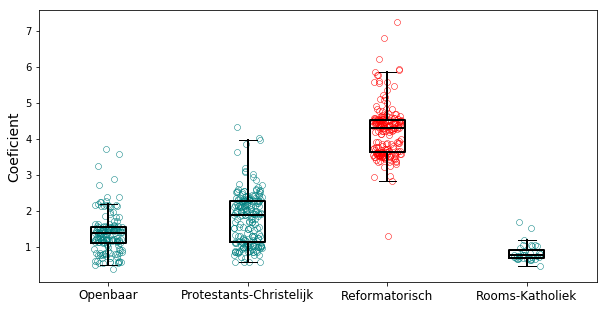

In [165]:
plt.figure(figsize=[10,5])

boxprops = dict(linewidth=2, color='k')
whiskerprops = dict(linewidth=2, color='k')
medianprops = dict(linewidth=2, color='k')

colors = ['teal', 'teal', 'r', 'teal']

randomx = [np.random.random(len(c)) for c in cos[2:6]]

for i,c in enumerate(cos[2:6]):
    plt.plot(0.9 + i + randomx[i]*0.2, c, 'o', mec=colors[i], mew=0.5, mfc='none')

plt.boxplot(cos[2:6],widths=0.25,boxprops=boxprops, whiskerprops=whiskerprops,medianprops=medianprops, showfliers=False )
plt.xticks(range(1, len(cos[2:6])+1), [n[15:-1] for n in names[2:6]], rotation=0, fontsize=12)

plt.ylabel('Coeficient', fontsize=14)


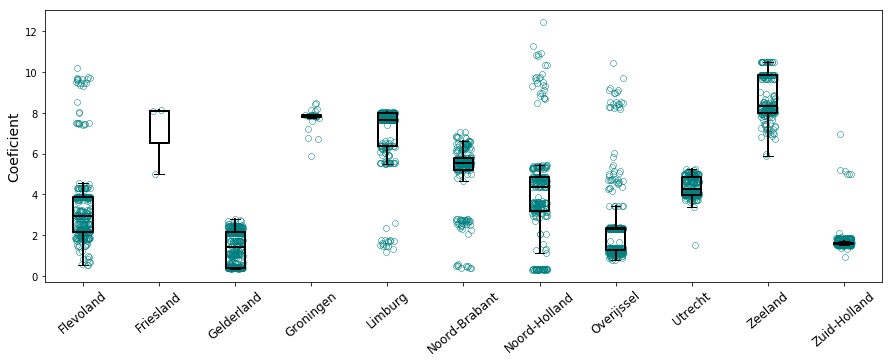

In [167]:
plt.figure(figsize=[15,5])

boxprops = dict(linewidth=2, color='k')
whiskerprops = dict(linewidth=2, color='k')
medianprops = dict(linewidth=2, color='k')

randomx = [np.random.random(len(c)) for c in cos[6:]]

for i,c in enumerate(cos[6:]):
    plt.plot(0.9 + i + randomx[i]*0.2, c, 'o', mec='teal', mew=0.5, mfc='none')

plt.boxplot(cos[6:],widths=0.25,boxprops=boxprops, whiskerprops=whiskerprops,medianprops=medianprops, showfliers=False )
plt.xticks(range(1, len(cos[6:])+1), [n[12:-1] for n in names[6:]], rotation=40, fontsize=12)

plt.ylabel('Coeficient', fontsize=14)


([<matplotlib.axis.XTick at 0x146014110>,
 <a list of 11 Text xticklabel objects>)

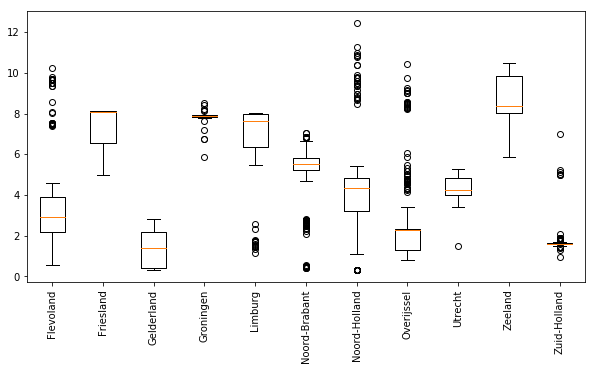

In [130]:
plt.figure(figsize=[10,5])
plt.boxplot(cos[6:])
plt.xticks(range(1, len(cos[6:])+1), [n[12:-1] for n in names[6:]], rotation=90)

In [158]:
[np.mean(c) for c in cos[2:6]]

[1.374452704705006, 1.7856338810483399, 4.194702198748254, 0.834068412531987]

In [159]:
[len(c) for c in cos[2:6]]

[160, 197, 200, 36]

In [169]:
school_data_p.provincie.unique()

array(['Drenthe', 'Flevoland', 'Friesland', 'Gelderland', 'Groningen',
       'Limburg', 'Noord-Brabant', 'Noord-Holland', 'Overijssel',
       'Utrecht', 'Zeeland', 'Zuid-Holland'], dtype=object)

In [170]:
names

['Denomination[T.Gereformeerd vrijgemaakt]',
 'Denomination[T.Joods]',
 'Denomination[T.Openbaar]',
 'Denomination[T.Protestants-Christelijk]',
 'Denomination[T.Reformatorisch]',
 'Denomination[T.Rooms-Katholiek]',
 'provincie[T.Flevoland]',
 'provincie[T.Friesland]',
 'provincie[T.Gelderland]',
 'provincie[T.Groningen]',
 'provincie[T.Limburg]',
 'provincie[T.Noord-Brabant]',
 'provincie[T.Noord-Holland]',
 'provincie[T.Overijssel]',
 'provincie[T.Utrecht]',
 'provincie[T.Zeeland]',
 'provincie[T.Zuid-Holland]']